Project by :
Safwan butto 


# 1. Task Definition and Challenges in Pronoun Resolution

## Pronoun Resolution
Pronoun resolution is a vital subset of coreference resolution that involves identifying the antecedents of pronouns within a text. This task focuses on accurately linking third-person pronouns such as "he," "she," and "it" to their respective referents. Proper pronoun resolution is essential for maintaining clarity and coherence in both narrative and expository texts, where pronouns substitute for previously mentioned entities, enhancing linguistic efficiency and avoiding redundancy.

## Key Challenges for Large Language Models (LLMs)
Despite advancements, LLMs face significant challenges in pronoun resolution due to several factors:
- **Ambiguity:** Pronouns can reference multiple entities within a passage, requiring nuanced interpretation of complex contextual cues to determine the correct antecedent.
- **Linguistic Distance:** Pronouns often refer back to nouns mentioned much earlier in the discourse, posing challenges in maintaining long-term dependencies within the text.
- **Common Sense and World Knowledge:** Effective pronoun resolution may require insights that extend beyond the text, such as societal norms or unspoken rules, which are often not explicitly stated.

Understanding these challenges is crucial for evaluating the current capabilities of LLMs in processing human language and highlights specific areas where improvements are necessary to achieve a more human-like understanding of text.

### Example:
- **Complexity Level:** 1
- **Original Sentence:** "Henry took the phone near the window. <PR>He</PR> handed <PR>it</PR> over."
- **Rewritten Sentence:** "Henry took the phone near the window. Henry handed the phone over."

This example illustrates a straightforward instance of pronoun resolution, where the pronouns "he" and "it" are correctly identified as referring to "Henry" and "the phone," respectively.

---

# 2. Description of Methodology for Testing LLMs on Coreference Resolution

## Dataset Creation
The primary methodology of this study involved constructing a specialized dataset to evaluate the ability of large language models (LLMs) to handle coreference resolution tasks of varying complexity. The dataset was designed to include sentences with multiple pronouns and noun references, where the LLMs' task was to correctly identify and associate each pronoun or noun phrase with the correct entity referred to within the sentence or across multiple sentences.

The dataset was generated programmatically using Python, with a focus on creating a diverse set of test cases that systematically increase in complexity. 

### 2a) Variable Selection and Sentence Construction

1. **Variable Selection:** The dataset generation script defines multiple lists of variables such as subjects (e.g., "Alice", "Bob"), verbs (e.g., "has", "found"), objects (e.g., "the book", "the keys"), locations (e.g., "on the desk", "in the car"), and actions (e.g., "put it in her bag", "left it there"). These elements are chosen to construct sentences that are rich in contextual details and referential challenges.


In [8]:
# Define data for sentence generation
subjects = ["Alice", "Bob", "Charlie", "Diana", "Eve", "Frank", "Grace", "Henry"]
verbs = ["has", "found", "took", "discovered", "noticed", "grabbed", "picked up", "came across"]
objects = ["the book", "the keys", "the wallet", "the phone", "the pen", "the notebook", "the laptop", "the watch"]
locations = ["on the desk", "in the car", "under the table", "near the window", "beside the chair", "on the shelf", "in the drawer", "on the floor"]
actions = ["put it in her bag", "left it there", "gave it to someone else", "placed it back", "handed it over", "kept it safe", "stored it away", "returned it"]
descriptions = ["tall one", "cheerful one", "thoughtful one", "intelligent one", "kind one", "brave one", "curious one", "friendly one"]
complex_actions = ["who was always losing things", "who never forgot a birthday", "who could solve any puzzle", "who loved to read books", "who enjoyed helping others", "who had a great sense of humor", "who was an excellent listener", "who had a passion for learning"]
conjunctions = ["and", "but", "yet", "so"]

# Mapping subjects to pronouns deterministically
subject_pronoun_map = {
    "Alice": "she",
    "Bob": "he",
    "Charlie": "he",
    "Diana": "she",
    "Eve": "she",
    "Frank": "he",
    "Grace": "she",
    "Henry": "he"
}



2. **Pronoun Tagging and Rewriting:** Each generated sentence is processed to tag pronouns and rewrite the sentence by replacing pronouns with the appropriate noun phrases. This dual representation (original with pronouns and rewritten without pronouns) serves as a key part of the dataset, allowing for direct comparison of model outputs against expected outputs.

In [9]:
import random

# Function to tag pronouns in a sentence and map them to their subjects
def tag_pronouns(test_case):
    original_sentence = test_case['original_sentence']
    rewritten_sentence = test_case['rewritten_sentence']
    original_words = original_sentence.split()
    pronoun_mapping = {}

    tagged_sentence = []
    subject = None

    for word in original_words:
        # Check for pronouns and tag them
        if word.lower() in ['he', 'she', 'it', 'it.']:
            if word == 'it.':
                word = 'it'
                tagged_word = f'<PR>{word}</PR>.'
                pronoun_mapping[word.lower()] = subject
            else:
                tagged_word = f'<PR>{word}</PR>'
                pronoun_mapping[word.lower()] = subject
        else:
            tagged_word = word
            # Update the current subject
            if word in subject_pronoun_map:
                subject = word
        tagged_sentence.append(tagged_word)

    return ' '.join(tagged_sentence), pronoun_mapping

# Function to replace pronouns in a sentence with their mapped subjects
def replace_pronouns(sentence, pronoun_mapping):
    words = sentence.split()
    for i, word in enumerate(words):
        lower_word = word.lower()
        if lower_word in pronoun_mapping:
            words[i] = pronoun_mapping[lower_word]
    return ' '.join(words)



3. **Sentence Construction:** The script combines these elements to form sentences that describe actions involving the subjects, objects, and locations. For instance, a sample generated sentence might be "Alice found the wallet on the desk. She put it in her bag."

In [10]:

# Function to generate sentences with various grammatical structures and features
def generate_sentence(**kwargs):
    subject = random.choice(subjects)
    verb = random.choice(verbs)
    object = random.choice(objects)
    location = random.choice(locations)
    pronoun = subject_pronoun_map[subject]
    action = random.choice(actions)

    # Generate main sentence with optional passive voice
    if kwargs.get("use_passive_voice", False) and random.random() < 0.5:
        main_sentence = f"{object.capitalize()} was {verb} by {subject} {location}."
    else:
        main_sentence = f"{subject} {verb} {object} {location}."
    
    follow_up_sentence = f"{pronoun.capitalize()} {action}."
    original_sentence = f"{main_sentence} {follow_up_sentence}"
    rewritten_sentence = f"{main_sentence} {subject} {action.replace('it', object)}."

    remaining_actions = actions.copy()
    remaining_actions.remove(action)

    # Optionally add multiple anaphoras
    if kwargs.get("use_multiple_anaphoras", False):
        for _ in range(kwargs.get("num_anaphoras", 1)):
            if remaining_actions:
                additional_action = random.choice(remaining_actions)
                remaining_actions.remove(additional_action)
                additional_anaphora = f"{pronoun.capitalize()} then {additional_action}."
                original_sentence += f" {additional_anaphora}"
                rewritten_sentence += f" {subject} then {additional_action.replace('it', object)}."

    # Optionally add nested clauses
    if kwargs.get("use_nested_clauses", False):
        for _ in range(kwargs.get("num_nested_clauses", 1)):
            nested_clause = f"{subject}, {random.choice(complex_actions)}, {random.choice(actions)}."
            original_sentence += f" {nested_clause}"
            rewritten_sentence += f" {nested_clause.replace('it', object)}"
    
    # Optionally add indirect references
    if kwargs.get("use_indirect_references", False):
        for _ in range(kwargs.get("num_indirect_references", 1)):
            indirect_reference = f"The {random.choice(descriptions)} person {random.choice(actions)}."
            original_sentence += f" {indirect_reference}"
            rewritten_sentence += f" {indirect_reference.replace('it', object)}"
    
    # Optionally add non-linear narrative elements
    if kwargs.get("use_non_linear_narrative", False):
        if remaining_actions:
            non_linear_action = random.choice(remaining_actions)
            non_linear_sentence = f"Before that, {subject} had {non_linear_action}."
            original_sentence = f"{non_linear_sentence} {original_sentence}"
            rewritten_sentence = f"{non_linear_sentence.replace('it', object)} {rewritten_sentence}"
        
    # Optionally add compound sentences
    if kwargs.get("use_compound_sentences", False):
        conjunction = random.choice(conjunctions)
        additional_sentence = f"{subject} {random.choice(verbs)} {random.choice(objects)} {random.choice(locations)}."
        original_sentence += f" {conjunction} {additional_sentence}"
        rewritten_sentence += f" {conjunction} {additional_sentence}"
        
    # Optionally add cataphoric references
    if kwargs.get("use_cataphoric_references", False):
        cataphoric_reference = f"Before {subject} {verb} {object}, {pronoun} {random.choice(actions)}."
        original_sentence = f"{cataphoric_reference} {original_sentence}"
        rewritten_sentence = f"{cataphoric_reference.replace('it', object)} {rewritten_sentence}"
    elif kwargs.get("use_cataphoric_references_replace_it", False) and random.random() < 0.5:
        cataphoric_reference = f"Before {'it'} was {verb} by {subject}, {pronoun} {random.choice(actions)}."
        original_sentence = f"{cataphoric_reference} {original_sentence}"
        rewritten_sentence = f"{cataphoric_reference.replace('it', object)} {rewritten_sentence}"
    
    # Tag pronouns and replace them in the rewritten sentence
    tagged_sen, pronoun_mapping = tag_pronouns({'original_sentence': original_sentence, 'rewritten_sentence': rewritten_sentence})
    rewritten_sentence = replace_pronouns(rewritten_sentence, pronoun_mapping)
    
    return tagged_sen, rewritten_sentence



4. **Complexity Levels:** To test LLMs across a spectrum of difficulties, the script incorporates various linguistic complexities:


In [11]:

# Function to generate test cases with increasing complexity
def generate_test_cases_with_increasing_complexity(num_test_cases=10):
    test_cases = []
    
    # Define different complexity levels with various grammatical features
    complexity_levels = [
        # Level 1: Basic Coreference
        # - Features Used: None
        # - Description: Involves straightforward actions and references with single pronouns needing resolution.
        {"use_multiple_anaphoras": False, "use_nested_clauses": False, "use_indirect_references": False, "use_non_linear_narrative": False, "use_compound_sentences": False, "use_passive_voice": False, "use_cataphoric_references": False},
        
        # Level 2: Introduction of Multiple Anaphoras
        # - New Feature: Multiple anaphoras (2 instances)
        # - Description: Requires resolving two pronoun references within the same sentence.
        {"use_multiple_anaphoras": True, "num_anaphoras": 2, "use_nested_clauses": False, "use_indirect_references": False, "use_non_linear_narrative": False, "use_compound_sentences": False, "use_passive_voice": False, "use_cataphoric_references": False},
        
        # Level 3: Addition of Nested Clauses
        # - New Feature: Nested clauses (1 instance)
        # - Description: Introduces a clause that adds descriptive detail, requiring the model to maintain context over a more structurally complex sentence.
        {"use_multiple_anaphoras": True, "num_anaphoras": 2, "use_nested_clauses": True, "num_nested_clauses": 1, "use_indirect_references": False, "use_non_linear_narrative": False, "use_compound_sentences": False, "use_passive_voice": False, "use_cataphoric_references": False},
        
        # Level 4: Introduction of Indirect References
        # - New Feature: Indirect references (1 instance)
        # - Description: Requires resolving references that are indirectly made through descriptions rather than direct pronouns.
        {"use_multiple_anaphoras": True, "num_anaphoras": 2, "use_nested_clauses": True, "num_nested_clauses": 1, "use_indirect_references": True, "num_indirect_references": 1, "use_non_linear_narrative": False, "use_compound_sentences": False, "use_passive_voice": False, "use_cataphoric_references": False},
        
        # Level 5: Non-Linear Narrative Introduction
        # - New Feature: Non-linear narrative
        # - Description: Actions are described out of chronological order, challenging the LLM’s ability to correctly sequence events.
        {"use_multiple_anaphoras": True, "num_anaphoras": 3, "use_nested_clauses": True, "num_nested_clauses": 1, "use_indirect_references": True, "num_indirect_references": 1, "use_non_linear_narrative": True, "use_compound_sentences": False, "use_passive_voice": False, "use_cataphoric_references": False},
        
        # Level 6: Compound Sentences and Multiple Nested Clauses
        # - New Features: Compound sentences and multiple nested clauses (2 instances)
        # - Description: Increased complexity with compound sentence structures and additional modifying clauses.
        {"use_multiple_anaphoras": True, "num_anaphoras": 3, "use_nested_clauses": True, "num_nested_clauses": 2, "use_indirect_references": True, "num_indirect_references": 2, "use_non_linear_narrative": True, "use_compound_sentences": True, "use_passive_voice": False, "use_cataphoric_references": False},
        
        # Level 7: Introduction of Passive Voice
        # - New Feature: Passive voice
        # - Description: Introduces passive constructions, which can obscure the subject of the sentence.
        {"use_multiple_anaphoras": True, "num_anaphoras": 3, "use_nested_clauses": True, "num_nested_clauses": 2, "use_indirect_references": True, "num_indirect_references": 2, "use_non_linear_narrative": True, "use_compound_sentences": True, "use_passive_voice": True, "use_cataphoric_references": False},
        
        # Level 8: Cataphoric References
        # - New Feature: Cataphoric references
        # - Description: Challenges the model with references that precede the noun or pronoun they describe.
        {"use_multiple_anaphoras": True, "num_anaphoras": 4, "use_nested_clauses": True, "num_nested_clauses": 2, "use_indirect_references": True, "num_indirect_references": 2, "use_non_linear_narrative": True, "use_compound_sentences": True, "use_passive_voice": True, "use_cataphoric_references": True},
        
        # Level 9: Increased Complexity in All Aspects
        # - New Feature: Increased complexity
        # - Description: Combines all previously introduced complexities in greater numbers, significantly increasing the difficulty level.
        {"use_multiple_anaphoras": True, "num_anaphoras": 4, "use_nested_clauses": True, "num_nested_clauses": 3, "use_indirect_references": True, "num_indirect_references": 3, "use_non_linear_narrative": True, "use_compound_sentences": True, "use_passive_voice": True, "use_cataphoric_references": True},
        
        # Level 10: Replacement of Direct Objects in Cataphoric References
        # - New Feature: Cataphoric reference replacement
        # - Description: Similar to level 9 but includes instances where 'it' is used before its noun reference is introduced.
        {"use_multiple_anaphoras": True, "num_anaphoras": 4, "use_nested_clauses": True, "num_nested_clauses": 3, "use_indirect_references": True, "num_indirect_references": 3, "use_non_linear_narrative": True, "use_compound_sentences": True, "use_passive_voice": True, "use_cataphoric_references": False, "use_cataphoric_references_replace_it": True},
        
        # Level 11: Maximal Complexity
        # - Description: Maxes out all parameters for complexity, including multiple anaphoras, nested clauses, indirect references, non-linear narratives, compound sentences, passive voice, and cataphoric references.
        {"use_multiple_anaphoras": True, "num_anaphoras": 5, "use_nested_clauses": True, "num_nested_clauses": 4, "use_indirect_references": True, "num_indirect_references": 4, "use_non_linear_narrative": True, "use_compound_sentences": True, "use_passive_voice": True, "use_cataphoric_references": True},
        
        # Level 12: Special Focus on Cataphoric References with Replacement
        # - Description: Focuses specifically on the complex handling of cataphoric references with direct object replacements, testing the model's ability to handle advanced predictive referencing.
        {"use_multiple_anaphoras": True, "num_anaphoras": 5, "use_nested_clauses": True, "num_nested_clauses": 4, "use_indirect_references": True, "num_indirect_references": 4, "use_non_linear_narrative": True, "use_compound_sentences": True, "use_passive_voice": True, "use_cataphoric_references": False, "use_cataphoric_references_replace_it": True}
    ]

    # Generate test cases for each complexity level
    for level, complexity_params in enumerate(complexity_levels):
        for _ in range(num_test_cases):
            original_sentence, rewritten_sentence = generate_sentence(**complexity_params)
            test_case = {
                "complexity_level": level + 1,
                "original_sentence": original_sentence,
                "rewritten_sentence": rewritten_sentence
            }
            test_cases.append(test_case)
    
    return test_cases
# Function to save generated test cases to a JSON file
def save_test_cases_to_json(test_cases, filename='anaphora_resolution_test_cases.json'):
    with open(filename, 'w') as f:
        json.dump(test_cases, f, indent=4)

# Example usage
num_test_cases_per_level = 1
test_cases = generate_test_cases_with_increasing_complexity(num_test_cases_per_level)
save_test_cases_to_json(test_cases)

print(f"Generated {len(test_cases)} test cases with increasing complexity.")
print("Test cases saved to 'anaphora_resolution_test_cases.json'")


Generated 12 test cases with increasing complexity.
Test cases saved to 'anaphora_resolution_test_cases.json'


In [12]:
# Descriptions and features used for each complexity level
complexity_levels_info = {
    1: {
        "title": "Level 1: Basic Coreference",
        "features_used": "None",
        "description": "Involves straightforward actions and references with single pronouns needing resolution."
    },
    2: {
        "title": "Level 2: Introduction of Multiple Anaphoras",
        "features_used": "Multiple anaphoras (2 instances)",
        "description": "Requires resolving two pronoun references within the same sentence."
    },
    3: {
        "title": "Level 3: Addition of Nested Clauses",
        "features_used": "Nested clauses (1 instance)",
        "description": "Introduces a clause that adds descriptive detail, requiring the model to maintain context over a more structurally complex sentence."
    },
    4: {
        "title": "Level 4: Introduction of Indirect References",
        "features_used": "Indirect references (1 instance)",
        "description": "Requires resolving references that are indirectly made through descriptions rather than direct pronouns."
    },
    5: {
        "title": "Level 5: Non-Linear Narrative Introduction",
        "features_used": "Non-linear narrative",
        "description": "Actions are described out of chronological order, challenging the LLM’s ability to correctly sequence events."
    },
    6: {
        "title": "Level 6: Compound Sentences and Multiple Nested Clauses",
        "features_used": "Compound sentences and multiple nested clauses (2 instances)",
        "description": "Increased complexity with compound sentence structures and additional modifying clauses."
    },
    7: {
        "title": "Level 7: Introduction of Passive Voice",
        "features_used": "Passive voice",
        "description": "Introduces passive constructions, which can obscure the subject of the sentence."
    },
    8: {
        "title": "Level 8: Cataphoric References",
        "features_used": "Cataphoric references",
        "description": "Challenges the model with references that precede the noun or pronoun they describe."
    },
    9: {
        "title": "Level 9: Increased Complexity in All Aspects",
        "features_used": "Increased complexity",
        "description": "Combines all previously introduced complexities in greater numbers, significantly increasing the difficulty level."
    },
    10: {
        "title": "Level 10: Replacement of Direct Objects in Cataphoric References",
        "features_used": "Cataphoric reference replacement",
        "description": "Similar to level 9 but includes instances where 'it' is used before its noun reference is introduced."
    },
    11: {
        "title": "Level 11: Maximal Complexity",
        "features_used": "Maximal complexity",
        "description": "Maxes out all parameters for complexity, including multiple anaphoras, nested clauses, indirect references, non-linear narratives, compound sentences, passive voice, and cataphoric references."
    },
    12: {
        "title": "Level 12: Special Focus on Cataphoric References with Replacement",
        "features_used": "Complex handling of cataphoric references with direct object replacements",
        "description": "Focuses specifically on the complex handling of cataphoric references with direct object replacements, testing the model's ability to handle advanced predictive referencing."
    }
}

# Function to highlight tagged words in a sentence with red color, keeping the tags
def highlight_tagged_words(sentence):
    highlighted_sentence = ""
    parts = sentence.split("<PR>")
    for part in parts:
        if "</PR>" in part:
            subparts = part.split("</PR>")
            highlighted_sentence += f"<PR>\033[31m{subparts[0]}\033[0m</PR>" + subparts[1]
        else:
            highlighted_sentence += part
    return highlighted_sentence

# Function to print the test cases with their descriptions from a JSON file
def print_test_cases_from_file(filename='anaphora_resolution_test_cases.json'):
    with open(filename, 'r') as f:
        test_cases = json.load(f)
    
    for test_case in test_cases:
        level = test_case['complexity_level']
        title = complexity_levels_info[level]["title"]
        features_used = complexity_levels_info[level]["features_used"]
        description = complexity_levels_info[level]["description"]
        
        original_sentence = highlight_tagged_words(test_case['original_sentence'])
        rewritten_sentence = highlight_tagged_words(test_case['rewritten_sentence'])
        
        print(f"{title}")
        print(f"- Features Used: {features_used}")
        print(f"- Description: {description}")
        print(f"- Original Sentence: {original_sentence}")
        print(f"- Rewritten Sentence: {rewritten_sentence}")
        print()

# Example usage
print_test_cases_from_file('anaphora_resolution_test_cases.json')


Level 1: Basic Coreference
- Features Used: None
- Description: Involves straightforward actions and references with single pronouns needing resolution.
- Original Sentence: Eve took the wallet in the drawer. <PR>She</PR> placed <PR>it</PR> back.
- Rewritten Sentence: Eve took the wallet in the drawer. Eve placed the wallet back.

Level 2: Introduction of Multiple Anaphoras
- Features Used: Multiple anaphoras (2 instances)
- Description: Requires resolving two pronoun references within the same sentence.
- Original Sentence: Eve came across the notebook on the floor. <PR>She</PR> gave <PR>it</PR> to someone else. <PR>She</PR> then kept <PR>it</PR> safe. <PR>She</PR> then returned <PR>it</PR>.
- Rewritten Sentence: Eve came across the notebook on the floor. Eve gave the notebook to someone else. Eve then kept the notebook safe. Eve then returned the notebook.

Level 3: Addition of Nested Clauses
- Features Used: Nested clauses (1 instance)
- Description: Introduces a clause that adds de


### 2b) Other Methodology

#### **Expanded Dataset Creation Methodology**:
- To enhance the complexity and variety of our coreference resolution dataset, we manually crafted an additional 8 complexity levels, complementing the 12 levels of automatically generated data for a total of twenty distinct levels. This manual effort was supported by the use of several large language models, which helped introduce nuanced challenges that mimic real-world text scenarios. 
- This approach was more favourable than generating automatically generated tests to increase the diversity and try to interduce new sentence patterns.


#### **Exploring Alternative Methods**:

Alongside manual crafting, we explored various methodologies to enhance and diversify our dataset:

- **NLTK:** We utilized the Natural Language Toolkit (NLTK) for its powerful linguistic analysis tools. Although NLTK enabled the creation of high-quality test cases (using dependency trees), we encountered challenging scalability issues, making it requiring more programming skills and time and more  feasible for generating data on a really larger scale and real world use cases .

- **spaCy:** Our initial trials with spaCy aimed to take advantage of its streamlined processing and robust language models. However, inconsistent results led us to discontinue its use as the primary tool for dataset generation.

- **Fine-Tuning GPT-3.5:** We also experimented with fine-tuning the GPT-3.5 model on the initially generated data. This technique produced some promising outcomes, showcasing the model's potential to handle complex coreference scenarios. Nonetheless, the lack of consistent performance across tests indicated the need for more precise tuning and possibly further refinement of the training datasets.
- **GPT-Assistants:** We were also curios to try using assistants to generate more tests but unfortunley  we didnt have enough time.

These explorations contributed valuable insights into the capabilities and limitations of various tools and techniques, informing our approach to creating a comprehensive and challenging dataset for testing large language models on coreference resolution tasks.

---

### 2 c,d)  Metrics Used to Quantify Work  and experiments you conducted
#### Metrics used to quantify your work:
- model: we tested over 20 models  and saved each one output in json fromat each model had atleast 2000 token context window in each prompt while prompt + tagged sentence were at most ~1000 token making sure token number isnt a bottle neck for the models.

- prompt : For each language model tested, the code evaluates its performance using different prompts(each run for a different prompt). Each test case consists of a system prompt, a user prompt, and a tagged sentence. 
The system prompt provides instructions to the model on how to resolve pronouns in the given sentence, while the user prompt contains the tagged sentence with pronouns enclosed in <PR,> tags.

- Complexity Level: Each test case is assigned a complexity level, which represents the increasing complexity of the sentences.

- Tokens Count: The code uses the count_tokens function to calculate the number of tokens in the user prompt using the "cl100k_base" encoding which is used for gpt3.5 models given us close estimate for tokens used for each model.

- Execution Time: The code measures the execution time of each API call to the language model. It calculates the elapsed time between the start and end of the API call, allowing you to analyze the performance and response time of the models. This metric helps in comparing the efficiency of different models in resolving anaphoric references.

The code saves the test results for each model in separate JSON files, with the naming convention "prompt{prompt_number}anaphora_resolution_results{model_name}.json". The inclusion of the prompt number and model name in the file name allows for easy identification and organization of the results.
Each JSON file contains an array of result objects, where each object represents a single test case. The result objects include the following fields:

- complexity_level: The complexity level of the test case.

- prompt: The input prompt given to the language model, which includes  the user prompt with the tagged sentence.

- expected_output: The expected resolved sentence, where the pronouns are replaced with their corresponding referent nouns.

- model_output: The actual output generated by the language model in response to the input prompt.

- tagged_sentence: The original tagged sentence with pronouns, as provided in the user prompt.

- tokens_count: The number of tokens in the user prompt, calculated using the count_tokens function.

- execution_time: The execution time of the API call to the language model, measured in seconds.

By saving the test results in JSON format, the code enables easy analysis and comparison of the models' performance across different prompts and complexity levels. The inclusion of the prompt number and model name in the file name facilitates the organization and tracking of results for each specific prompt and model combination.

---


# 3. Evaluated  language models accessed using private api 
#### we assessed a variety of language models across different families, including the Claude series, Gemini models, and various iterations of the GPT models. Each of these models was accessed through private APIs, which allowed for detailed and controlled testing environments. The models tested include:


- claude-2.0
- claude-2.1
- claude-3-haiku-20240307
- claude-3-opus-20240229
- claude-3-sonnet-20240229
- claude-instant-1.2
- gemini-1.0-pro
- gemini-1.0-pro-001
- gemini-1.0-pro-latest
- gemini-1.5-flash-latest
- gemini-1.5-pro-latest
- gpt-3.5-turbo-0125
- gpt-3.5-turbo-0301
- gpt-3.5-turbo-0613
- gpt-3.5-turbo-1106
- gpt-4-0125-preview
- gpt-4-0613
- gpt-4-turbo-2024-04-09
- gpt-4-turbo-preview
- gpt-4o


**Variability in Performance:** Different versions of the same model family often showed significant variations in performance, reflecting updates and changes in model architectures and training datasets.

**TogetherApi**: we tried testing open source models from together api like llama but their results werent very promising and we phased problems extracting the answers.


---

# 4. Prompting and Prompt-Construction Strategies
## a)
- Our prompting strategies were meticulously crafted to assess the coreference resolution capabilities of various LLMs. Each prompt was designed to clearly communicate the task requirements to the model, ensuring a structured approach to pronoun resolution across different complexity levels and contexts. For prompts 1-5, we used a zero-shot approach with a defined system role.
---
### **Prompt 1: Basic Pronoun Resolution**

**System:**  
- You are a chatbot designed for generating sentences that involve pronoun resolution. For each sentence, provide an original sentence with pronouns (he, she, it) tagged with <PR,> and a rewritten sentence where all pronouns are replaced by the proper nouns they refer to. Increase the complexity level by adding more sentences and diverse pronoun uses at higher levels.  
Format:  
complexity_level: The level of complexity (ranging from 1 to 100).  
original_sentence: The sentence containing pronouns, with pronouns marked using <PR,> tags.  
rewritten_sentence: The sentence with pronouns replaced by the appropriate proper nouns.  
Examples:  
Complexity Level 1  
Original Sentence: "Bob has the pen beside the chair. <PR,>He</PR,> returned it."  
Rewritten Sentence: "Bob has the pen beside the chair. Bob returned the pen."

**User:**  
- Replace only the tagged pronouns (he, she, it) in the following sentence with their corresponding referents as defined in the context below. Maintain the rest of the sentence as it is.

---

### **Prompt 2: Contextual Pronoun Resolution** (with the help of claude prompt generator)

**System:**  
- You will be given a context and a sentence with pronouns tagged like this: <PR>pronoun</PR>. Your task is to resolve the tagged pronouns in the sentence.  
For example, if the context was "John went to the store. He bought some milk." and the tagged sentence was "<PR>He</PR> paid for <PR>it</PR>.", the resolved sentence would be "John paid for the milk."  
To complete this task, follow these steps:
1. Carefully read the provided context to understand who or what each pronoun in the tagged sentence is referring to.  
2. For each tagged pronoun in the sentence:  
   a. Determine the referent (the person or thing the pronoun refers to) using the context.  
   b. Replace the pronoun and its surrounding <PR> tags with the referent.  
3. Maintain the rest of the sentence exactly as it is, only replacing the tagged pronouns and their <PR> tags.  
4. Output the fully resolved sentence with no remaining tagged pronouns inside <resolved_sentence> tags.

**User:**  
- Here is the tagged sentence you should resolve pronouns for:

---

### **Prompt 3: Role Playing in Subjects Related to the Problem** (little additional instructions)

**System:**  
- You are a professional editor specializing in pronoun resolution, NLP, and English grammar.  
Your task is to assist authors by replacing the tagged pronouns (he, she, it) in their manuscripts with the corresponding referents based on the sentence context.  
Your goal is to ensure clarity and coherence in their writing. Maintain the rest of the sentence exactly as it is.

**User:**  
- Here is the sentence you should resolve pronouns for:

---

### Prompt 4: Comprehensive Sentence Rewriting

**System:**  
- In this task, you are required to carefully read sentences containing pronouns and rewrite these sentences by replacing each pronoun with the specific noun it refers to. This requires an understanding of the sentence context and the relationships between subjects, objects, and pronouns.

**User:**  
- Now, please proceed with rewriting the sentences provided, ensuring all pronouns are correctly replaced with their corresponding nouns:

---

### Prompt 5: Detailed Pronoun Resolution Instructions

**System:**  
- Here is a sentence with pronouns tagged:  
Your task is to resolve the pronouns in this sentence, replacing each pronoun with the specific noun it refers to based on the context of the sentence.  
To do this, follow these steps:  
1. Read the sentence carefully, paying attention to the overall meaning and the relationships between different entities mentioned.  
2. Look at each pronoun enclosed in <PR> tags:  
   a. Determine which noun that pronoun is referring to, based on the context.  
   b. Replace the pronoun and its surrounding <PR> tags with that noun.  
3. Do not make any other changes to the sentence. Your only task is to replace the tagged pronouns with their referent nouns. All other words should be left exactly as they are.  
4. After resolving all pronouns, output the complete sentence inside <resolved_sentence> tags.

**User:**  
- Here is the tagged sentence you should resolve pronouns for:

---

Each prompt was strategically designed to engage the LLMs in a specific manner, ranging from basic pronoun swaps to intricate editorial tasks that simulate real-world applications of NLP technology. This diverse array of prompts enabled us to thoroughly assess the models' proficiency in handling varying levels of linguistic complexity and pronoun resolution challenges.

In [ ]:

import os
import json
from openai import OpenAI
import tiktoken
import time
import anthropic

def count_tokens(string, encoding_name="cl100k_base"):
    """Returns the number of tokens in a text string."""
    encoding = tiktoken.get_encoding(encoding_name)
    encoding = tiktoken.encoding_for_model("gpt-3.5-turbo-0125")
    num_tokens = len(encoding.encode(string))
    return num_tokens

def query_claude_api(system_prompt, user_prompt, model="claude-3-sonnet-20240229"):
    client = anthropic.Anthropic(
    # defaults to os.environ.get("ANTHROPIC_API_KEY")
    api_key="",
                )
    start_time = time.time()  # Start time before the API call
    message = client.messages.create(
    model=model,
    max_tokens=2110,
    temperature=0,
    system=system_prompt,
    messages=[
                {
                    "role": "user",
                    "content": [
                        {
                            "type": "text",
                            "text": user_prompt
                        }
                    ]
                }
            ]
        )
    end_time = time.time()  # End time after the API call
    elapsed_time = end_time - start_time  # Calculate elapsed time
    return message.content[0].text, elapsed_time

def query_openai_api(system_prompt, user_prompt, model="gpt-3.5-turbo-0125"):
    client = OpenAI()
    start_time = time.time()  # Start time before the API call

    response = client.chat.completions.create(
        model=model,
        messages=[
            {"role": "system", "content": system_prompt},
            {"role": "user", "content": user_prompt}
        ],
        temperature=0.2,
        max_tokens=2000,
        top_p=1
    )
    
    end_time = time.time()  # End time after the API call
    elapsed_time = end_time - start_time  # Calculate elapsed time
    
    return response.choices[0].message.content, elapsed_time

def create_and_evaluate_llm(file_path, output_path, model):
    with open(file_path, 'r') as file:
        test_cases = json.load(file)
    
    results = []
    system_prompt = """

         your system_prompt here 
    """

    for test_case in test_cases:
        tagged_sentence = test_case['original_sentence']
        
        prompt = f"Here is the  tagged sentence you should resolve pronouns for: \n\n<tagged_sentence>{tagged_sentence}</tagged_sentence> Provide your output with no extra text, commentary or chat. Simply output the sentence with pronouns resolved. "
        
        llm_input = {
            "prompt": prompt,
            "completion": test_case['rewritten_sentence'],
            "complexity_level": test_case['complexity_level'],
        }

        user_prompt = llm_input["prompt"]
        if model.startswith("claude"):
            model_output, execution_time = query_claude_api(system_prompt, user_prompt, model)
        else:
            
            model_output, execution_time = query_openai_api(system_prompt, user_prompt, model)
        
        result = {
            "complexity_level": llm_input["complexity_level"],
            "prompt": llm_input["prompt"],
            "expected_output": llm_input["completion"],
            "model_output": model_output,
            "tagged_sentence": test_case['original_sentence'],
            "tokens_count": count_tokens(llm_input["prompt"]),
            "execution_time": execution_time
        }
        
        results.append(result)
    
    with open(output_path, 'w') as outfile:
        json.dump(results, outfile, indent=4)
    
    return results

# Example usage
model_names_gpt35 = ["gpt-3.5-turbo-0613", "gpt-3.5-turbo-1106", "gpt-3.5-turbo-0301", "gpt-3.5-turbo-0125"]
#model_names_gpt4 = ["gpt-4o", "gpt-4-turbo-2024-04-09", "gpt-4-0613", "gpt-4-turbo-preview", "gpt-4-0125-preview"]
#model_names_gemini = ["gemini-1.0-pro-001", "gemini-1.0-pro","gemini-1.0-pro-latest","gemini-1.5-flash-latest","gemini-1.5-pro-latest"]
#model_names_claude = [ "claude-3-haiku-20240307","claude-3-sonnet-20240229","claude-3-opus-20240229","claude-2.1","claude-2.0","claude-instant-1.2"]
for model_name in model_names_gpt35:
    print(f"Using model: {model_name}")
    results = create_and_evaluate_llm("x_new_generated.json", f"prompt5_anaphora_resolution_results_{model_name}.json", model_name)
    print(f"Results saved to prompt5_anaphora_resolution_results_{model_name}.json")


# 4 Prompting and Prompt-Construction Strategies
 ## b) 

we implemented a few-shot technique, allowing the model to retry multiple times if necessary.

Below is a summary of the prompt construction methods used in our experiments:

---


### **Prompt 6: Basic Pronoun Resolution**

**System:**  
Here is a sentence with pronouns tagged:

<tagged_sentence>
{{TAGGED_SENTENCE}}
</tagged_sentence>

Your task is to resolve the pronouns in this sentence, replacing each pronoun with the specific noun it refers to based on the context of the sentence.

To do this, follow these steps:

1. Read the sentence carefully, paying attention to the overall meaning and the relationships between different entities mentioned.
2. Look at each pronoun enclosed in <PR> tags:
   a. Determine which noun that pronoun is referring to, based on the context.
   b. Replace the pronoun and its surrounding <PR> tags with that noun.
3. Do not make any other changes to the sentence. Your only task is to replace the tagged pronouns with their referent nouns. All other words should be left exactly as they are.
4. After resolving all pronouns, output the complete sentence inside <resolved_sentence> tags.

For example, if the tagged sentence was "John took the ball and <PR>he</PR> kicked <PR>it</PR>", the resolved sentence would be:
<resolved_sentence>John took the ball and John kicked the ball</resolved_sentence>

**User:**  
Here is the tagged sentence you should resolve pronouns for:  
<tagged_sentence>{tagged_sentence}</tagged_sentence>  
Provide your output with no extra text, commentary, or chat. Simply output the sentence with pronouns resolved.

**Max Retries:** 6

---

### **Prompt 7: Contextual Pronoun Resolution**

**System:**  
Your task is to resolve each pronoun in the order they appear in the text, determining which entity they refer to. To do this:
1. Read through the text and identify all tagged pronouns in the order they appear.
2. For each pronoun:
   a) Look at the preceding text to determine which entity the pronoun is referring to. Pay attention to names, nouns, and context.
   b) If the pronoun refers to an entity that has already been referenced by a previous pronoun, use the same referent for consistency.
   c) If the pronoun introduces a new entity that hasn't been named, give it a generic name like "the object", "the person", "someone", etc. to avoid introducing incorrect names.
3. Once you've resolved all pronouns, rewrite the full text, replacing each tagged pronoun with the name or description of its referent.
4. Output the full text with resolved pronouns without tags.

Here is an example of how your output should look:

**Input:**  
Before that, Bob had kept <PR>it</PR> safe. Bob grabbed the pen near the window. <PR>He</PR> placed <PR>it</PR> back. <PR>He</PR> then handed <PR>it</PR> over. <PR>He</PR> then gave <PR>it</PR> to someone else. <PR>He</PR> then put <PR>it</PR> in her bag. Bob, who enjoyed helping others, stored <PR>it</PR> away. The curious one person put <PR>it</PR> in her bag.

**Output:**  
Before that, Bob had kept the pen safe. Bob grabbed the pen near the window. Bob placed the pen back. Bob then handed the pen over. Bob then gave the pen to someone else. Bob then put the pen in her bag. Bob, who enjoyed helping others, stored the pen away. The curious one person put the pen in her bag.

**User:**  
Resolve the pronouns and output the full text without any extra tags / words: {tagged_sentence}

**Max Retries:** 4

---

### **Prompt 8: Example-Based Pronoun Resolution**

**System:**  
Your task is to resolve each pronoun in the order they appear in the text, determining which entity they refer to. Examples:

**Input:**  
Bob discovered the pen beside the chair. <PR>He</PR> handed <PR>it</PR> over.

**Output:**  
Bob discovered the pen beside the chair. Bob handed the pen over.

**Input:**  
Before that, Bob had kept <PR>it</PR> safe. Bob grabbed the pen near the window. <PR>He</PR> placed <PR>it</PR> back. <PR>He</PR> then handed <PR>it</PR> over. <PR>He</PR> then gave <PR>it</PR> to someone else. <PR>He</PR> then put <PR>it</PR> in her bag. Bob, who enjoyed helping others, stored <PR>it</PR> away. The curious one person put <PR>it</PR> in her bag.

**Output:**  
Before that, Bob had kept the pen safe. Bob grabbed the pen near the window. Bob placed the pen back. Bob then handed the pen over. Bob then gave the pen to someone else. Bob then put the pen in her bag. Bob, who enjoyed helping others, stored the pen away. The curious one person put the pen in her bag.

**Input:**  
Before that, Alice had stored <PR>it</PR> away. Alice noticed the book on the floor. <PR>She</PR> left <PR>it</PR> there. <PR>She</PR> then put <PR>it</PR> in her bag. <PR>She</PR> then kept <PR>it</PR> safe. <PR>She</PR> then gave <PR>it</PR> to someone else. <PR>She</PR> then placed <PR>it</PR> back. <PR>She</PR> then handed <PR>it</PR> over. Alice, who was always losing things, kept <PR>it</PR> safe. Alice, who never forgot a birthday, handed <PR>it</PR> over. Alice, who had a great sense of humor, kept <PR>it</PR> safe. Alice, who enjoyed helping others, handed <PR>it</PR> over. The tall one person placed <PR>it</PR> back. The curious one person returned <PR>it</PR>. The curious one person returned <PR>it</PR>. The intelligent one person placed <PR>it</PR> back. yet Alice grabbed the laptop on the shelf.

**Output:**  
Before that, Alice had stored the book away. Alice noticed the book on the floor. Alice left the book there. Alice then put the book in her bag. Alice then kept the book safe. Alice then gave the book to someone else. Alice then placed the book back. Alice then handed the book over. Alice, who was always losing things, kept the book safe. Alice, who never forgot a birthday, handed the book over. Alice, who had a great sense of humor, kept the book safe. Alice, who enjoyed helping others, handed the book over. The tall one person placed the book back. The curious one person returned the book. The curious one person returned the book. The intelligent one person placed the book back. yet Alice grabbed the laptop on the shelf.

**User:**  
Can you help me resolve the pronouns in the sentence please:  
{tagged_sentence}

**Max Retries:** 4

---

### **Prompt 9: Professional Editing for Pronoun Resolution**

**System:**  
You are a professional editor specializing in pronoun resolution, NLP, and English grammar.  
Your task is to assist authors by replacing the tagged pronouns (he, she, it) in their manuscripts with the corresponding referents based on the sentence context.  
Your goal is to ensure clarity and coherence in their writing. Maintain the rest of the sentence exactly as it is.

Imagine you are working with an author who has provided the following sentences for you to edit:

**Example Manuscript:**  
1:  
<tagged_sentence>  
Before that, Bob had stored <PR>it</PR> away. <PR>He</PR> gave <PR>it</PR> to someone else. <PR>He</PR> then returned <PR>it</PR>. <PR>He</PR> then left <PR>it</PR> there. <PR>He</PR> then kept <PR>it</PR> safe. <PR>He</PR> then placed <PR>it</PR> back. Bob, who was an excellent listener, handed <PR>it</PR> over. Bob, who always kept her word, kept <PR>it</PR> safe. The kind one person returned <PR>it</PR>. The curious one person handed <PR>it</PR> over. The tall one person left <PR>it</PR> there. The tall one person gave <PR>it</PR> back. The cheerful one person placed <PR>it</PR> back. yet Bob found the wallet on the shelf. yet Bob noticed the keys on the floor. yet Bob kept the phone safe. and Bob stored the pen away. and Bob placed the pen back. and Bob left the

 phone there. and Bob handed the keys over. and Bob put the wallet in her bag.  
</tagged_sentence>

**Expected Output:**  
Before that, Bob had stored the wallet away. Bob gave the wallet to someone else. Bob then returned the wallet. Bob then left the wallet there. Bob then kept the wallet safe. Bob then placed the wallet back. Bob, who was an excellent listener, handed the wallet over. Bob, who always kept her word, kept the wallet safe. The kind one person returned the wallet. The curious one person handed the wallet over. The tall one person left the wallet there. The tall one person gave the wallet back. The cheerful one person placed it back. The cheerful one person kept it safe. The tall one person returned it. The kind one person gave it back. The tall one person handed it over. Bob, who was cheerful, placed it back. Bob, who was tall, kept the wallet safe. Bob, who was tall, handed it over. The generous one person stored it away. The cheerful one person put the phone in her bag. The generous one person handed the wallet over. yet Bob noticed the keys on the floor. yet Bob returned the keys. yet Bob handed the keys over. yet Bob kept the phone safe. yet Bob placed the wallet back. so Bob, who never forgot a birthday, put the phone in her bag. so Bob, who always arrived early, kept the keys safe. yet Bob noticed the phone on the shelf. yet Bob gave the phone to someone else. yet Bob kept the pen safe. and Bob handed the keys over. and Bob put the wallet in her bag. and Bob placed the phone back. and Bob placed the wallet back. and Bob gave the wallet to someone else.

2:  
<tagged_sentence>  
John went to the store. He bought some milk. <PR>He</PR> paid for <PR>it</PR> using cents.  
</tagged_sentence>

**Expected Output:**  
John went to the store. He bought some milk. John paid for the milk using cents.

**User:**  
Resolve the pronouns and output the full text without any extra tags / words: {tagged_sentence}

**Max Retries:** 5

---

Each prompt was strategically designed to engage the LLMs in a specific manner, ranging from basic pronoun swaps to intricate editorial tasks that simulate real-world applications of NLP technology. This diverse array of prompts enabled us to thoroughly assess the models' proficiency in handling varying levels of linguistic complexity and pronoun resolution challenges.

In [ ]:
import time
import re
import anthropic
from openai import OpenAI
import tiktoken

def count_tokens(string, encoding_name="cl100k_base"):
    # Returns the number of tokens in a text string using a specific encoding
    encoding = tiktoken.get_encoding(encoding_name)
    encoding = tiktoken.encoding_for_model("gpt-3.5-turbo-0125")
    num_tokens = len(encoding.encode(string))
    return num_tokens

def query_claude_api(system_prompt, user_prompt, model="claude-3-sonnet-20240229"):
    # Queries the Claude API with the given prompts and returns the response and elapsed time
    client = anthropic.Anthropic(api_key="api_key")
    start_time = time.time()
    message = client.messages.create(
        model=model,
        max_tokens=2110,
        temperature=0,
        system=system_prompt,
        messages=[
            {
                "role": "user",
                "content": [
                    {
                        "type": "text",
                        "text": user_prompt
                    }
                ]
            }
        ]
    )
    end_time = time.time()
    elapsed_time = end_time - start_time
    return message.content[0].text, elapsed_time

def query_openai_api(system_prompt, user_prompt, model="gpt-3.5-turbo-0125"):
    # Queries the OpenAI API with the given prompts and returns the response and elapsed time
    client = OpenAI()
    start_time = time.time()

    response = client.chat.completions.create(
        model=model,
        messages=[
            {"role": "system", "content": system_prompt},
            {"role": "user", "content": user_prompt}
        ],
        temperature=0.2,
        max_tokens=2000,
        top_p=1
    )
    
    end_time = time.time()
    elapsed_time = end_time - start_time
    
    return response.choices[0].message.content, elapsed_time

def normalize_text(text):
    # Normalizes the text by removing specific tags and formatting
    text = re.sub(r'\bHere\b.*?:\s*', '', text)
    text = re.sub(r'<PR>|</PR>', '', text)  # Remove pronoun tags
    text = re.sub(r'<resolved_sentence>|</resolved_sentence>', '', text)  # Remove resolved sentence tags
    text = re.sub(r'<tagged_sentence>|</tagged_sentence>', '', text)  # Remove resolved sentence tags
    text = re.sub(r'\*(.*?)\*', r'\1', text)  # Remove emphasis formatting
    text = re.sub(r'\s+([.,!?;:])', r'\1', text)  # Remove extra spaces before punctuation
    text = re.sub(r'\s+', ' ', text)  # Normalize white spaces
    return text.strip()

def create_and_evaluate_llm(file_path, output_path, model):
    # Creates and evaluates an LLM by processing test cases and comparing outputs
    with open(file_path, 'r') as file:
        test_cases = json.load(file)
    
    results = []
    system_prompt = """
your system_prompt here

    """

    for test_case in test_cases:
        tagged_sentence = test_case['original_sentence']
        expected_output = test_case['rewritten_sentence']
        
        prompt = f"Resolve the pronouns and output the full text without any extra tags / words: {tagged_sentence} "
        
        user_prompt = prompt
        model_output = ""
        execution_time = 0
        tries = 0
        
        # Try resolving the pronouns up to 4 times
        while normalize_text(model_output) != normalize_text(expected_output):
            tries += 1
            if tries > 4:
                break
            if tries > 1:
                user_prompt = f"Here is the sentence you should resolve pronouns for:<tagged_sentence>{tagged_sentence}</tagged_sentence> Your Output: Provide your output with no extra text, commentary, or chat. Simply output the sentence with pronouns resolved."
                
            if model.startswith("claude"):
                model_output, execution_time = query_claude_api(system_prompt, user_prompt, model)
            else:
                model_output, execution_time = query_openai_api(system_prompt, user_prompt, model)
            print(f"Expected: {normalize_text(expected_output)}\nModel Output: {normalize_text(model_output)}\nTries: {tries}\n")
        
        result = {
            "complexity_level": test_case['complexity_level'],
            "prompt": user_prompt,
            "expected_output": expected_output,
            "model_output": model_output,
            "tagged_sentence": test_case['original_sentence'],
            "tokens_count": count_tokens(user_prompt),
            "execution_time": execution_time,
            "tries": tries
        }
        
        results.append(result)
    
    with open(output_path, 'w') as outfile:
        json.dump(results, outfile, indent=4)
    
    return results

# Example usage
model_names_gpt35 = ["gpt-3.5-turbo-0613", "gpt-3.5-turbo-1106", "gpt-3.5-turbo-0125","gpt-4o"]
for model_name in model_names_gpt35:
    print(f"Using model: {model_name}")
    results = create_and_evaluate_llm("x_new_generated.json", f"fewshots/fewshots4_anaphora_resolution_results_{model_name}.json", model_name)
    print(f"Results saved to prompt5_anaphora_resolution_results_{model_name}.json")


### 5) Discussion of the Experiments and the Results

#### Generating the Results

To evaluate the pronoun resolution capabilities of various large language models (LLMs), we designed a systematic approach involving multiple steps and tools:

1. **Data Preparation**:
   - We curated a dataset of test cases, each consisting of a tagged sentence with pronouns, an expected output where pronouns are resolved, and metadata including model output, token count, and execution time.
   - The test cases were stored in JSON format, allowing for structured and consistent data processing.

2. **Text Normalization**:
   - To ensure fair and consistent comparisons, we applied text normalization to both the expected and model outputs. The normalization process included:
     - **Removing Specific Tags**: Stripping tags like `<PR>` and `<resolved_sentence>` to focus on the core content.
     - **Eliminating Extra Spaces**: Removing unnecessary spaces and ensuring uniform punctuation spacing.
     - **Removing Emphasis Formatting**: Stripping out any formatting elements like italics or bold markers.
   - The normalization function utilized regular expressions to automate these text modifications.

3. **Output Comparison and Metrics Calculation**:
   - For each test case, we compared the normalized model output to the normalized expected output using several metrics:
     - **Correctness**: A boolean value indicating whether the normalized outputs matched exactly the test sentence.
     - **Cosine Similarity**: Calculated using TF-IDF vectorization to measure the textual similarity between the expected and model outputs.
     - **Tokens Generated per Second**: Determined by dividing the token count by the execution time, providing a measure of the model’s efficiency.
  
4. **Retry Mechanism**:
   - For each prompt 6-9, we allowed the model to retry multiple times to improve accuracy, up to a predefined maximum number of retries:
     - **Prompt 1**: Maximum of 6 retries
     - **Prompt 2**: Maximum of 4 retries
     - **Prompt 3**: Maximum of 4 retries
     - **Prompt 4**: Maximum of 5 retries
   - This approach provided the models with additional opportunities to generate correct outputs, enhancing the reliability of the evaluation.

 ### Manual Review and Evaluation:
   - To complement the quantitative analysis, we manually reviewed a subset of model outputs to identify specific issues and strengths.
   - We used `difflib` to highlight differences between the expected and model outputs, visually marking discrepancies. Words present in the expected output but missing in the model output were highlighted in red, while additional words in the model output were highlighted in green.
   - This manual review provided qualitative insights into the models’ performance, helping us understand where and why certain models failed and enhance the text normalizing function.

### Qualitative Evaluation

The qualitative analysis involved a manual review of selected test cases to identify specific issues and strengths in model outputs. Here are some notable observations:

1. **Consistency Issues**:
   - Many models struggled with consistently resolving multiple pronouns within a single sentence. While they often resolved the first pronoun correctly, subsequent pronouns were sometimes left unresolved or incorrectly replaced.

2. **Context Understanding**:
   - Models varied in their ability to understand and maintain context, especially in complex sentences. The "gpt-4" models generally performed better in maintaining context and resolving pronouns accurately.

3. **Output Format**:
   - Differences in output formats sometimes led to incorrect evaluations. For example, some models included additional formatting or context-related information, which, if not properly normalized, could affect the correctness check we tried to cover most models format variations.




In [13]:

import difflib
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
# Set seaborn style for professional plots
sns.set(style="whitegrid")

def load_data_from_json(json_input):
    """Load data from a JSON file or JSON string."""
    if isinstance(json_input, str):
        try:
            data = json.loads(json_input)
        except json.JSONDecodeError:
            with open(json_input, 'r') as file:
                data = json.load(file)
    else:
        data = json_input
    return data

def normalize_text(text):
    """Normalize text by removing specific tags and extra spaces."""
    text = re.sub(r'\bRewritten\b.*?:\s*', '', text)
    text = re.sub(r'\b1.\b.*?:\s*', '', text)

    text = re.sub(r'\bHere\b.*?:\s*', '', text)
    text = re.sub(r'<ins>|</ins>', '', text)  # Remove pronoun tags

    text = re.sub(r'<PR>|</PR>', '', text)  # Remove pronoun tags
    text = re.sub(r'<resolved_sentence>|</resolved_sentence>', '', text)  # Remove resolved sentence tags
    text = re.sub(r'<tagged_sentence>|</tagged_sentence>', '', text)  # Remove resolved sentence tags
    text = re.sub(r'\*(.*?)\*', r'\1', text)  # Remove emphasis formatting
    text = re.sub(r'\s+([.,!?;:])', r'\1', text)  # Remove extra spaces before punctuation
    text = re.sub(r'\s+', ' ', text)  # Normalize white spaces
    return text

def compare_outputs(tagged_sentence, expected_output, model_output, tokens, execution_time):
    """Compare model output with the expected output and calculate metrics."""
    expected_output_normalized = normalize_text(expected_output)
    model_output_normalized = normalize_text(model_output)
    correct = model_output_normalized.strip() == expected_output_normalized.strip()

    vectorizer = TfidfVectorizer()
    vectors = vectorizer.fit_transform([expected_output_normalized.lower(), model_output_normalized.lower()])
    cosine_sim = cosine_similarity(vectors[0], vectors[1])[0][0]

    return {
        "correct": correct,
        "cosine_similarity": cosine_sim,
        "tokens_generated_per_second": tokens / execution_time if execution_time > 0 else 0,
    }

def highlight_differences(expected_output, model_output):
    """Highlight differences between the expected and model outputs."""
    expected_output_normalized = normalize_text(expected_output)
    model_output_normalized = normalize_text(model_output)
    diff = difflib.ndiff(expected_output_normalized.split(), model_output_normalized.split())
    highlighted_expected = []
    highlighted_model = []
    for word in diff:
        if word.startswith('- '):
            highlighted_expected.append(f"\033[91m{word[2:]}\033[0m")
        elif word.startswith('+ '):
            highlighted_model.append(f"\033[92m{word[2:]}\033[0m")
        elif word.startswith('  '):
            highlighted_expected.append(word[2:])
            highlighted_model.append(word[2:])
    return ' '.join(highlighted_expected), ' '.join(highlighted_model)

def evaluate_all(data):
    """Evaluate all data entries and compute summary metrics."""
    results = []
    cosine_sims = []
    tokens_per_sec = []

    for entry in data:
        result = compare_outputs(
            entry['tagged_sentence'],
            entry['expected_output'],
            entry['model_output'],
            entry['tokens_count'],
            entry['execution_time']
        )
        results.append(result)
        cosine_sims.append(result['cosine_similarity'])
        tokens_per_sec.append(result['tokens_generated_per_second'])

    correct_count = sum(1 for result in results if result['correct'])
    avg_cosine_similarity = np.mean(cosine_sims)
    avg_tokens_per_sec = np.mean(tokens_per_sec)

    summary = {
        "number_of_tests": len(results),
        "number_of_correct_answers": correct_count,
        "average_tokens_per_second": avg_tokens_per_sec,
        "average_cosine_similarity": avg_cosine_similarity
    }

    return summary, results

def plot_sorted_metrics(metric_data, model_names, metric_name, title, percentage=False):
    """Plot sorted metrics for given models with a custom color palette based on model prefix."""
    sorted_indices = np.argsort(metric_data)
    sorted_data = np.array(metric_data)[sorted_indices]
    sorted_model_names = np.array(model_names)[sorted_indices]

    if percentage:
        sorted_data *= 100

    # Define base colors for each prefix
    prefix_colors = {
        'gpt-4': '#1f77b4',  # blue
        'gpt-3': '#ff7f0e',  # orange
        'gem': '#2ca02c',    # green
        'cla': '#d62728',    # red
    }

    # Generate a hue based on model prefixes
    hues = []
    prefix_counts = {key: 0 for key in prefix_colors.keys()}
    for model in sorted_model_names:
        match = re.match(r"^(gpt-4|gpt-3|gem|cla)", model)
        if match:
            prefix = match.group(1)
            hues.append(prefix)
            prefix_counts[prefix] += 1
        else:
            hues.append('other')

    plt.figure(figsize=(12, 6))
    sns.barplot(x=sorted_model_names, y=sorted_data, hue=hues, dodge=False, palette=prefix_colors, legend=False)
    plt.xlabel('Model Names', fontsize=14)
    plt.ylabel(f'{metric_name} (%)' if percentage else metric_name, fontsize=14)
    plt.title(title, fontsize=16, weight='bold')
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', linewidth=0.7)
    plt.tight_layout()
    plt.savefig(f"{title}.png", dpi=300)
    plt.show()



def run_evaluation(file_path, model_name, evaluation_summaries, model_names, test_case_failures=None, prompt_prefix=""):
    """Run evaluation for a specific model and update summaries and failures."""
    json_data = load_data_from_json(file_path)
    summary, evaluation_results = evaluate_all(json_data)
    evaluation_summaries.append(summary)
    model_names.append(model_name)
    failures_count = [0] * len(json_data)  # Assuming each entry in json_data corresponds to a test case

    if test_case_failures is not None:
        for i, result in enumerate(evaluation_results):
            if not result['correct']:
                test_case_failures[i].add(f"{prompt_prefix}{model_name}")
                failures_count[i] += 1  # Count failures per test case


    print("--------")
    print(f"Evaluation results for model: {prompt_prefix}{model_name}")
    print(f"Number of tests: {summary['number_of_tests']}")
    print(f"Number of correct outputs: {summary['number_of_correct_answers']}")
    print(f"Average cosine similarity: {summary['average_cosine_similarity']:.2f}")
    print(f"Average tokens generated per second: {summary['average_tokens_per_second']:.2f}")
    if test_case_failures is not None:
        print("\nMismatched Words:")
        for i, result in enumerate(evaluation_results, start=1):
            if not result['correct']:
                print(f"Test Case {i}:")
                tagged_sentence = json_data[i-1]['tagged_sentence']
                expected_output = json_data[i-1]['expected_output']
                model_output = json_data[i-1]['model_output']
                expected_output_normalized = normalize_text(expected_output)
                model_output_normalized = normalize_text(model_output)
                highlighted_expected, highlighted_model = highlight_differences(expected_output_normalized, model_output_normalized)
                print(f"  Tagged Sentence: {tagged_sentence}")
                print(f"  Expected Output: {highlighted_expected}")
                print(f"  Model Output: {highlighted_model}\n")
                print(f"  Cosine Similarity: {result['cosine_similarity']:.2f}")
                print(f"  Tokens per second: {result['tokens_generated_per_second']:.2f}")
                print("--------")
    print(f"Tests for {prompt_prefix}{model_name} are done")
    print("-" * 150)
# Example usage
model_names = [
    "gpt-3.5-turbo-0613", "gpt-3.5-turbo-1106", "gpt-3.5-turbo-0301", "gpt-3.5-turbo-0125",
    "gpt-4o", "gpt-4-turbo-2024-04-09", "gpt-4-0613", "gpt-4-turbo-preview", "gpt-4-0125-preview",
    "gemini-1.0-pro-001", "gemini-1.0-pro", "gemini-1.0-pro-latest", "gemini-1.5-flash-latest", "gemini-1.5-pro-latest",
    "claude-3-haiku-20240307", "claude-3-sonnet-20240229", "claude-3-opus-20240229", "claude-2.1", "claude-2.0", "claude-instant-1.2"
]

evaluation_summaries_prompt1 = []
evaluation_summaries_prompt2 = []
evaluation_summaries_prompt3 = []
evaluation_summaries_prompt4 = []
evaluation_summaries_prompt5 = []
evaluation_summaries_prompt6 = []
evaluation_summaries_prompt7 = []
evaluation_summaries_prompt8 = []
evaluation_summaries_prompt9 = []

model_names_list_prompt1 = []
model_names_list_prompt2 = []
model_names_list_prompt3 = []
model_names_list_prompt4 = []
model_names_list_prompt5 = []
model_names_list_prompt6 = []
model_names_list_prompt7 = []
model_names_list_prompt8 = []
model_names_list_prompt9 = []

num_tests_all = len(load_data_from_json(f'anaphora_resolution_results_{model_names[0]}.json'))
test_case_failures_prompt1 = [set() for _ in range(num_tests_all)]
test_case_failures_prompt2 = [set() for _ in range(num_tests_all)]
test_case_failures_prompt3 = [set() for _ in range(num_tests_all)]
test_case_failures_prompt4 = [set() for _ in range(num_tests_all)]
test_case_failures_prompt5 = [set() for _ in range(num_tests_all)]
test_case_failures_prompt6 = [set() for _ in range(num_tests_all)]
test_case_failures_prompt7 = [set() for _ in range(num_tests_all)]
test_case_failures_prompt8 = [set() for _ in range(num_tests_all)]
test_case_failures_prompt9 = [set() for _ in range(num_tests_all)]
#for creating document we will output only for 1 model omment the next line to test all  models
model_names=['gpt-4o']
for model_name in model_names:
    file_paths = [
        f'anaphora_resolution_results_{model_name}.json',
        f'prompt2_anaphora_resolution_results_{model_name}.json',
        f'prompt3_anaphora_resolution_results_{model_name}.json',
        f'prompt4_anaphora_resolution_results_{model_name}.json',
        f'prompt5_anaphora_resolution_results_{model_name}.json',
         f'fewshots/fewshots1_anaphora_resolution_results_{model_name}.json',
        f'fewshots/fewshots2_anaphora_resolution_results_{model_name}.json',
        f'fewshots/fewshots3_anaphora_resolution_results_{model_name}.json',
        f'fewshots/fewshots4_anaphora_resolution_results_{model_name}.json',
    ]
    
    #for creating document we will output only for 1 prompt comment the next line to test all  prompts
    file_paths=[f'anaphora_resolution_results_{model_name}.json']
    for i, file_path in enumerate(file_paths, 1):
        if not os.path.exists(file_path):
            continue
        eval_summaries = eval(f"evaluation_summaries_prompt{i}")
        model_list = eval(f"model_names_list_prompt{i}")
        test_case_failures = eval(f"test_case_failures_prompt{i}")
        run_evaluation(file_path, model_name, eval_summaries, model_list, test_case_failures, f"Prompt {i}: ")


--------
Evaluation results for model: Prompt 1: gpt-4o
Number of tests: 20
Number of correct outputs: 16
Average cosine similarity: 0.99
Average tokens generated per second: 69.36

Mismatched Words:
Test Case 10:
  Tagged Sentence: Before <PR>it</PR> was discovered by Bob, <PR>he</PR> stored <PR>it</PR> away. Before that, Bob had placed <PR>it</PR> back. The pen was discovered by Bob on the floor. <PR>He</PR> returned <PR>it</PR>. <PR>He</PR> then put <PR>it</PR> in her bag. <PR>He</PR> then stored <PR>it</PR> away. <PR>He</PR> then gave <PR>it</PR> to someone else. <PR>He</PR> then kept <PR>it</PR> safe. Bob, who had a passion for learning, gave <PR>it</PR> to someone else. Bob, who had a passion for learning, kept <PR>it</PR> safe. Bob, who was an excellent listener, returned <PR>it</PR>. The curious one person returned <PR>it</PR>. The thoughtful one person handed <PR>it</PR> over. The friendly one person kept <PR>it</PR> safe. so Bob discovered the notebook on the shelf.
  Expecte

---

### Results Summary

Based on the results and the plots, we observed several key trends and findings in the performance of different language models on coreference resolution tasks:

1. **GPT-4 Models**:
   - The GPT-4 models consistently achieved the highest scores across various prompts, indicating superior performance in resolving pronouns accurately and maintaining context.

2. **Impact of Prompts on Model Performance**:
   - Different prompts affected models differently. Some prompts enhanced the abilities of specific models while diminishing the performance of others.
   - For instance, certain prompts significantly improved the performance of model X but had a detrimental effect on model Y, and vice versa.
   - In some cases, prompts led to improved performance for both models, while others caused a decrease in performance for one model and an increase for another.

3. **Role-Playing Prompts**:
   - Prompts that involved role-playing as a professional in context-related subjects achieved the best scores. This suggests that providing a specific, realistic context can help models perform better in pronoun resolution tasks.

4. **GPT-3.5 Models**:
   - GPT-3.5 models showed notably good results with Prompt 5, which involved complex instructions and a chain of thought approach. This indicates that detailed and structured prompts can enhance the performance of GPT-3.5 models.

5. **Few-Shot Prompts**:
   - Both GPT-3.5 and Claude Haiku models demonstrated better results when tested with few-shot prompts. This suggests that providing multiple examples helps these models learn and adapt better to the task.

6. **Prompt Generation**:
   - The choice of model used to generate the prompts also influenced which models benefited from the prompts. Certain models seemed to respond better to prompts generated by specific models, highlighting the importance of prompt design and its impact on model performance.

### Conclusion

The experiments and evaluations revealed that GPT-4 models are currently the most capable in handling coreference resolution tasks, consistently outperforming other models across various prompts. The design of the prompts plays a crucial role in influencing model performance. Role-playing prompts and detailed instructions were particularly effective, especially for GPT-3.5 models. Additionally, incorporating few-shot examples significantly improved the results for both GPT-3.5 and Claude Haiku models. These findings underscore the importance of tailored prompt design and the potential benefits of context-specific and example-driven approaches in enhancing the capabilities of large language models. Future research and development should continue to explore these areas to further improve model accuracy and reliability in complex NLP tasks.


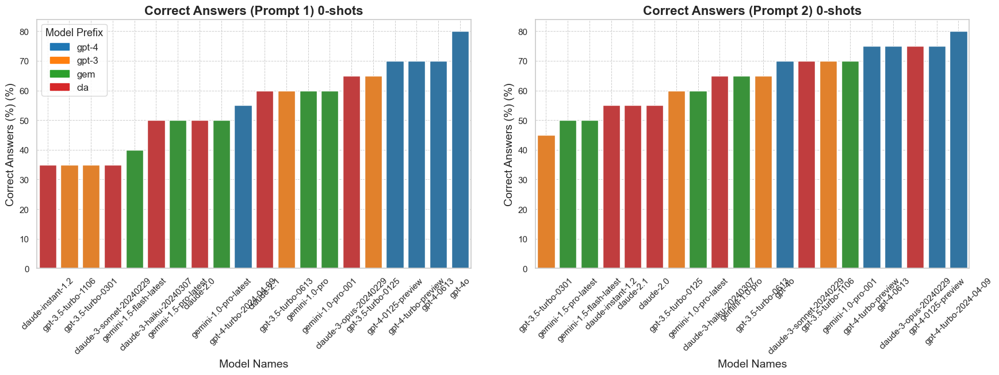

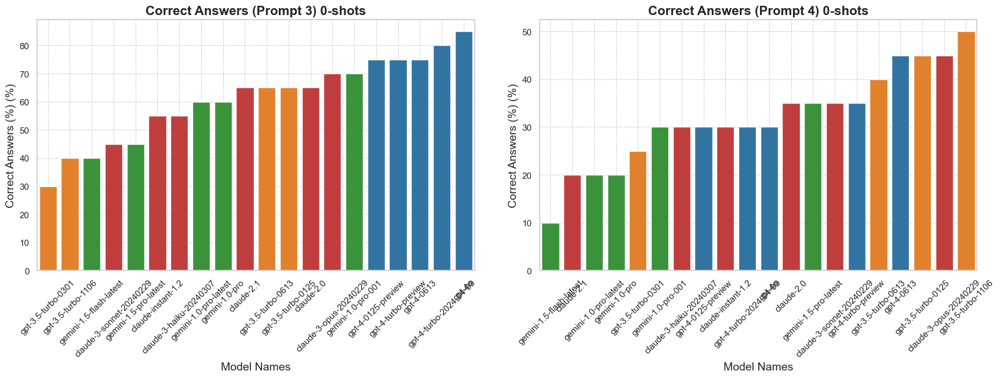

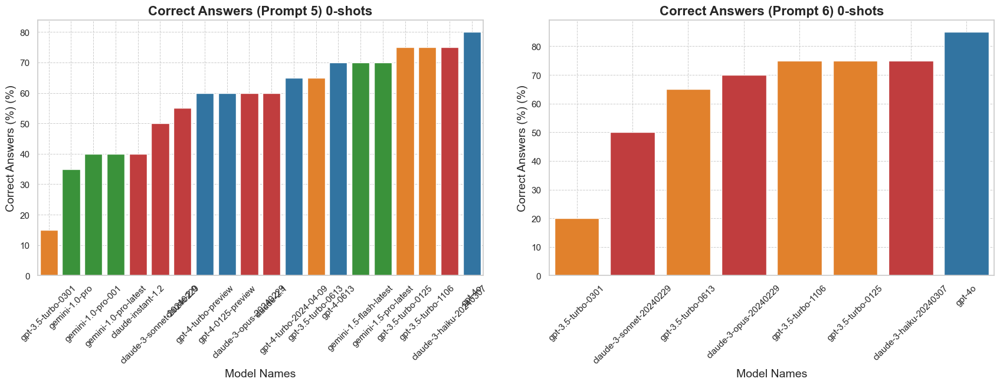

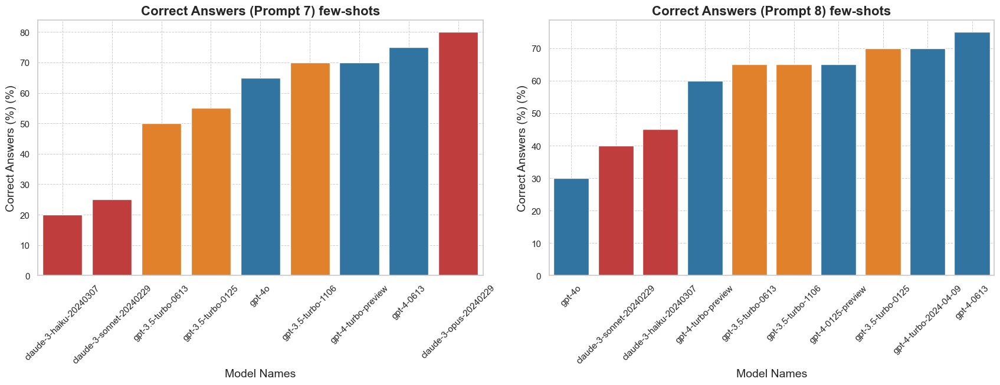

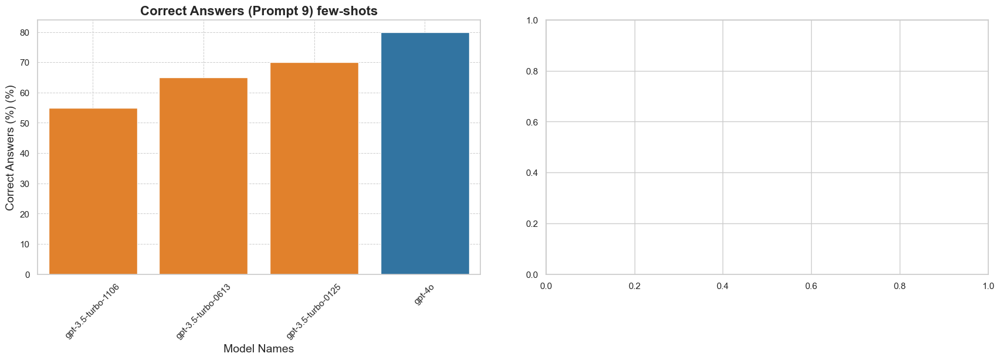

In [50]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch

def plot_sorted_metrics(ax, metric_data, model_names, metric_name, title, percentage=False, add_legend=False):
    """Plot sorted metrics for given models with a custom color palette based on model prefix."""
    sorted_indices = np.argsort(metric_data)
    sorted_data = np.array(metric_data)[sorted_indices]
    sorted_model_names = np.array(model_names)[sorted_indices]

    if percentage:
        sorted_data *= 100

    # Define base colors for each prefix
    prefix_colors = {
        'gpt-4': '#1f77b4',  # blue
        'gpt-3': '#ff7f0e',  # orange
        'gem': '#2ca02c',    # green
        'cla': '#d62728',    # red
    }

    # Generate a hue based on model prefixes
    hues = []
    prefix_counts = {key: 0 for key in prefix_colors.keys()}
    for model in sorted_model_names:
        match = re.match(r"^(gpt-4|gpt-3|gem|cla)", model)
        if match:
            prefix = match.group(1)
            hues.append(prefix)
            prefix_counts[prefix] += 1
        else:
            hues.append('other')

    sns.barplot(ax=ax, x=sorted_model_names, y=sorted_data, hue=hues, dodge=False, palette=prefix_colors, legend=False)
    ax.set_xlabel('Model Names', fontsize=14)
    ax.set_ylabel(f'{metric_name} (%)' if percentage else metric_name, fontsize=14)
    ax.set_title(title, fontsize=16, weight='bold')
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, linestyle='--', linewidth=0.7)

    if add_legend:
        handles = [Patch(color=color, label=prefix) for prefix, color in prefix_colors.items()]
        ax.legend(handles=handles, title="Model Prefix", fontsize=12, title_fontsize='13')

# Combine all data for plotting
all_model_names = [model_names_list_prompt1, model_names_list_prompt2, model_names_list_prompt3, model_names_list_prompt4, model_names_list_prompt5, model_names_list_prompt6, model_names_list_prompt7, model_names_list_prompt8, model_names_list_prompt9]
all_evaluation_summaries = [evaluation_summaries_prompt1, evaluation_summaries_prompt2, evaluation_summaries_prompt3, evaluation_summaries_prompt4, evaluation_summaries_prompt5, evaluation_summaries_prompt6, evaluation_summaries_prompt7, evaluation_summaries_prompt8, evaluation_summaries_prompt9]

correct_answers_percent = [[summary['number_of_correct_answers'] / num_tests_all for summary in summaries] for summaries in all_evaluation_summaries]
cosine_similarity = [[summary['average_cosine_similarity'] for summary in summaries] for summaries in all_evaluation_summaries]
tokens_per_second = [[summary['average_tokens_per_second'] for summary in summaries] for summaries in all_evaluation_summaries]

# Plot metrics for all models combined for both prompts
for i in range(0, 9, 2):
    fig, axs = plt.subplots(1, 2, figsize=(18, 6))
    fig.tight_layout(pad=4.0)
    
    for j in range(2):
        if i + j < 9:
            ax = axs[j]
            title_suffix = "0-shots" if i + j < 6 else "few-shots"
            add_legend = (i == 0 and j == 0)  # Add legend to the first subplot only
            plot_sorted_metrics(ax, correct_answers_percent[i + j], all_model_names[i + j], 'Correct Answers (%)', f'Correct Answers (Prompt {i + j + 1}) {title_suffix}', percentage=True, add_legend=add_legend)
    
    plt.savefig(f"Combined_Correct_Answers_Prompts_{i+1}_to_{i+2}.png", dpi=300)
    plt.show()


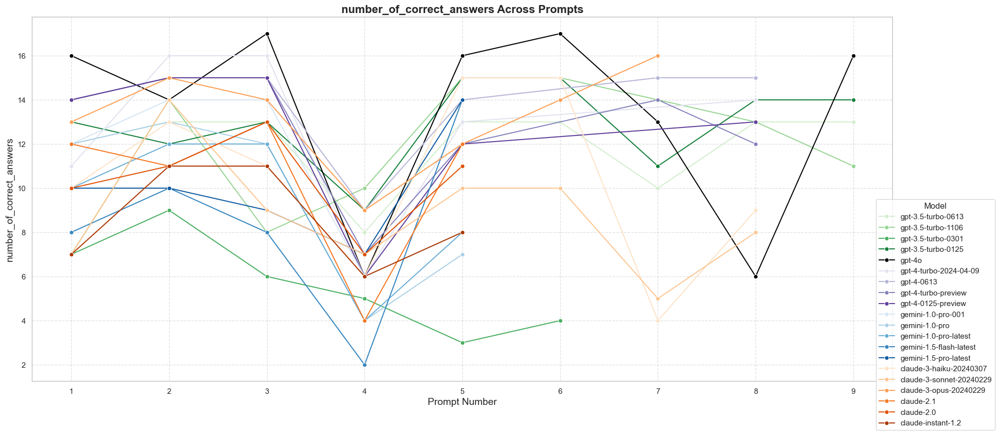

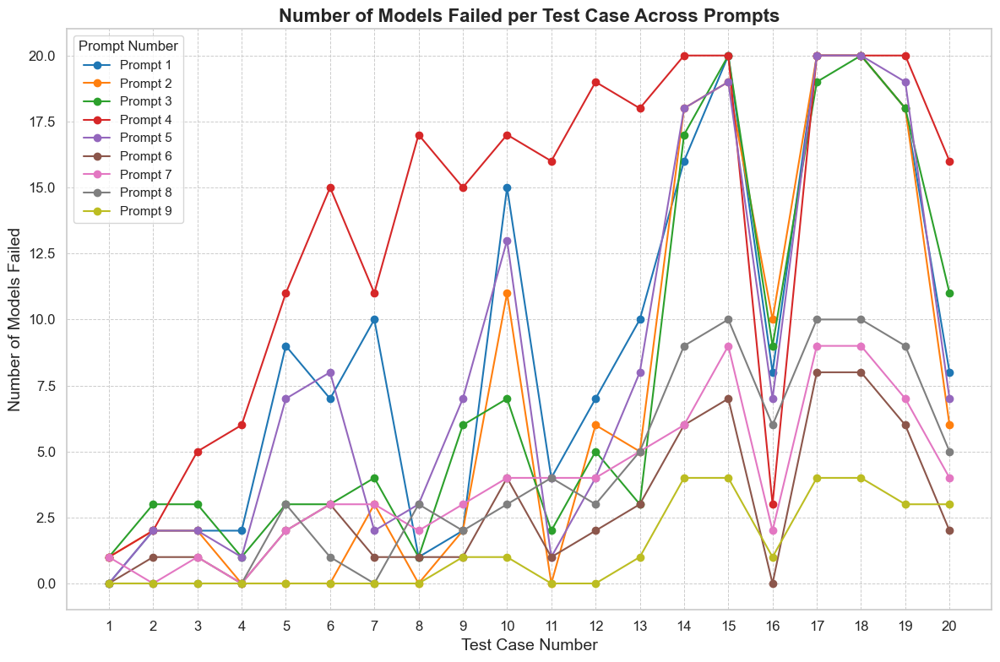

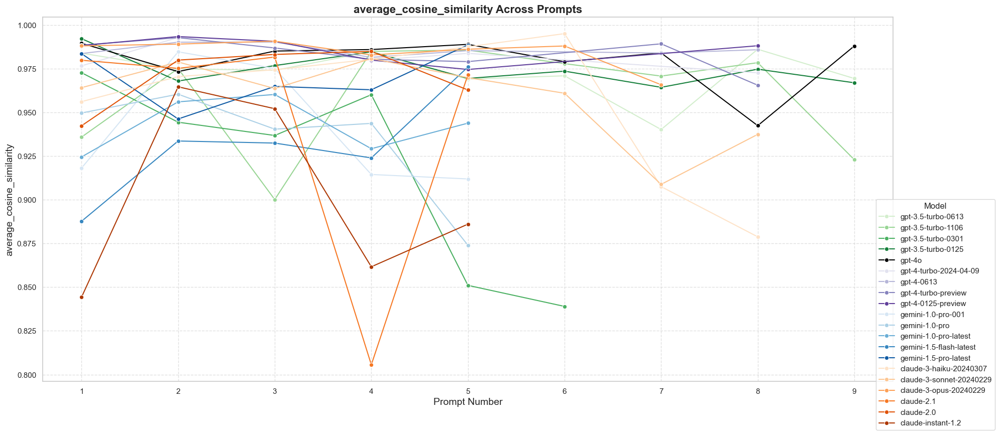

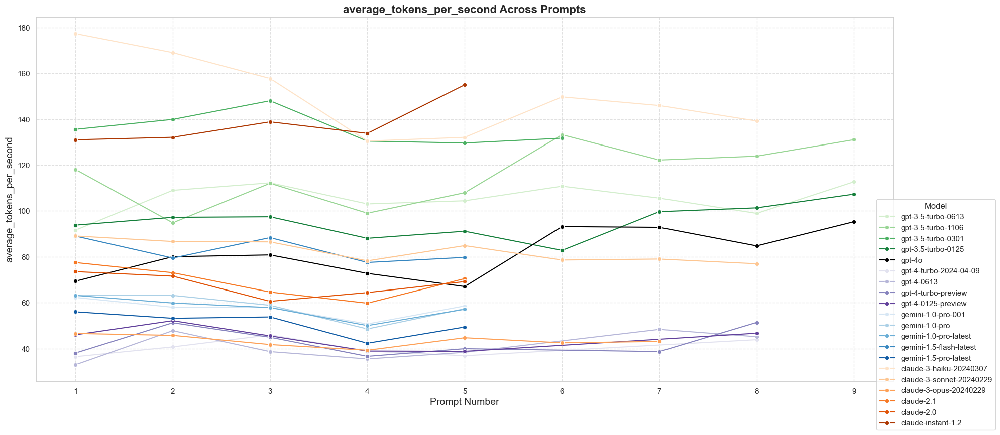

In [47]:

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set seaborn style for professional plots
sns.set(style="whitegrid")

# Existing utility functions: load_data_from_json, normalize_text, compare_outputs, highlight_differences, evaluate_all

def prepare_data_for_plotting(all_evaluation_summaries, model_names):
    """Prepare data for plotting by restructuring it into a DataFrame."""
    data = []
    for prompt_index, summaries in enumerate(all_evaluation_summaries):
        for model_index, summary in enumerate(summaries):
            summary['Prompt'] = prompt_index + 1
            summary['Model'] = model_names[prompt_index][model_index]
            data.append(summary)
    return pd.DataFrame(data)

import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
def plot_metric_trends(df, metric):
    """
    Plot trends for a given metric across different prompts for each model with a custom color palette based on model prefix.

    Args:
        df (pd.DataFrame): DataFrame containing the data to plot.
        metric (str): The metric to plot.
    """
    # Define base colors for each prefix using Seaborn color palettes
    base_colors = {
        'gpt-4-': sns.color_palette("Purples",4),
        'gpt-3': sns.color_palette("Greens", 4),
        'gem': sns.color_palette("Blues", 5),
        'cla': sns.color_palette("Oranges", 6),
        'gpt-4o': ['black']  # Fixed color for 'gpt-4o'
    }

    # Generate a color for each model based on its prefix
    model_names = df['Model'].unique()
    colors = {}
    prefix_counts = {key: 0 for key in base_colors.keys()}
    
    for model in model_names:
        match = re.match(r"^(gpt-4-|gpt-3|gem|cla|gpt-4o)", model)
        if match:
            prefix = match.group(1)
            if prefix == 'gpt-4o':
                colors[model] = 'black'
            else:
                # Get a specific color from the list based on the index
                color_index = prefix_counts[prefix] % len(base_colors[prefix])
                colors[model] = base_colors[prefix][color_index]
                prefix_counts[prefix] += 1
        else:
            # Use a default gray color if no prefix match is found
            colors[model] = '#cccccc'

    # Apply the colors to the plot
    plt.figure(figsize=(20, 9))  # Increase the width of the plot
    sns.lineplot(data=df, x='Prompt', y=metric, hue='Model', palette=colors, marker='o')
    plt.title(f'{metric} Across Prompts', fontsize=16, weight='bold')
    plt.xlabel('Prompt Number', fontsize=14)
    plt.ylabel(metric, fontsize=14)
    plt.legend(title='Model', bbox_to_anchor=(1.05, 0.5), loc='upper center', borderaxespad=0.)  # Position legend to the right
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
def plot_combined_failed_tests(all_data):
    """Plot the combined line plot for all prompts."""
    plt.figure(figsize=(12, 8))
    colors = sns.color_palette("tab10", n_colors=9)  # Adjust this based on how many plots you have
    
    for i, data in enumerate(all_data):
        plt.plot(data[0], data[1], label=f'Prompt {i+1}', color=colors[i], marker='o')
    
    plt.xlabel('Test Case Number', fontsize=14)
    plt.ylabel('Number of Models Failed', fontsize=14)
    plt.title('Number of Models Failed per Test Case Across Prompts', fontsize=16, weight='bold')
    plt.xticks(data[0], fontsize=12)  # Assuming all test cases have the same number of cases
    plt.yticks(fontsize=12)
    plt.legend(title="Prompt Number")
    plt.grid(True, linestyle='--', linewidth=0.7)
    plt.tight_layout()
    plt.savefig("Combined_Failed_Tests.png", dpi=300)
    plt.show()

# Main Evaluation Loop and Data Aggregation (assuming you already have this set up)

# Example usage
# Combining all model names and summaries
all_model_names = [model_names_list_prompt1, model_names_list_prompt2, model_names_list_prompt3, model_names_list_prompt4, model_names_list_prompt5,model_names_list_prompt6,model_names_list_prompt7,model_names_list_prompt8,model_names_list_prompt9]
all_evaluation_summaries = [evaluation_summaries_prompt1, evaluation_summaries_prompt2, evaluation_summaries_prompt3, evaluation_summaries_prompt4, evaluation_summaries_prompt5,evaluation_summaries_prompt6,evaluation_summaries_prompt7,evaluation_summaries_prompt8,evaluation_summaries_prompt9]

# Prepare data for plotting
df = prepare_data_for_plotting(all_evaluation_summaries, all_model_names)

# Plot trends for each metric
metrics = ['number_of_correct_answers','combined_failed', 'average_cosine_similarity', 'average_tokens_per_second']
for metric in metrics:
    if metric == 'combined_failed':
        plot_combined_failed_tests([(list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt1]),
                            (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt2]),
                            (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt3]),
                            (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt4]),
                            (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt5]),
                              (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt6]),
                              (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt7]),
                              (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt8]),
                                (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt9])])
                              
        continue
                                   
    plot_metric_trends(df, metric)


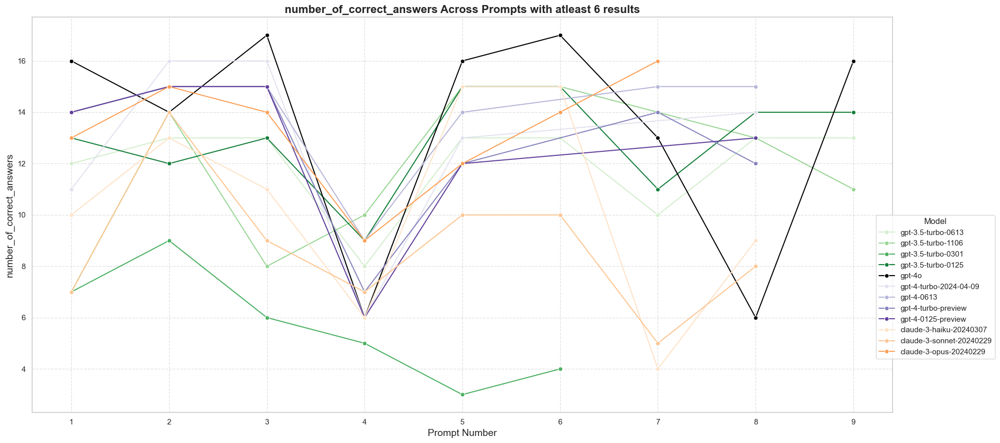

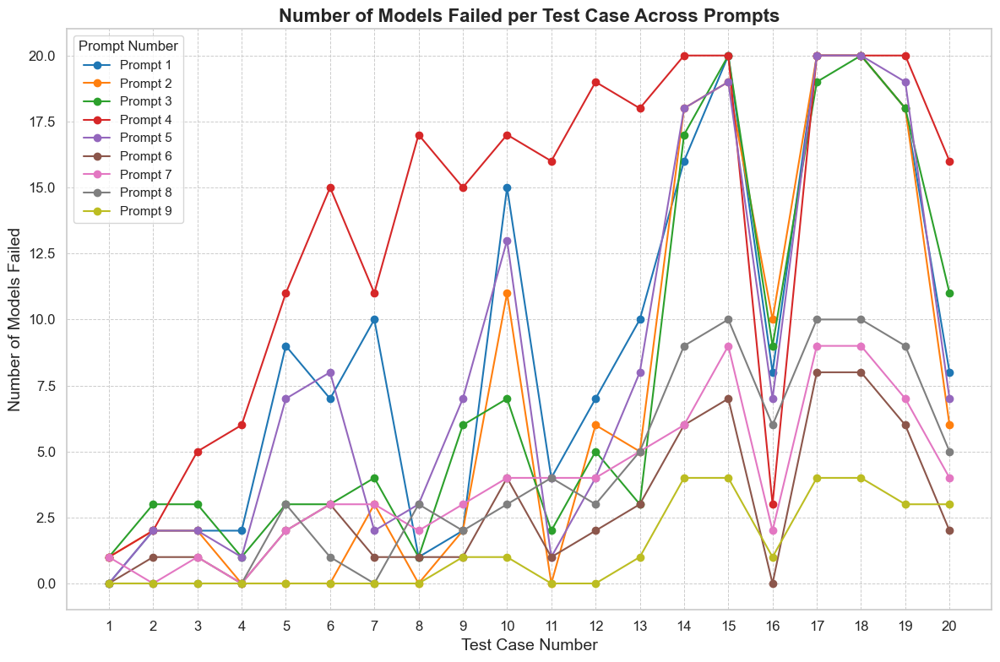

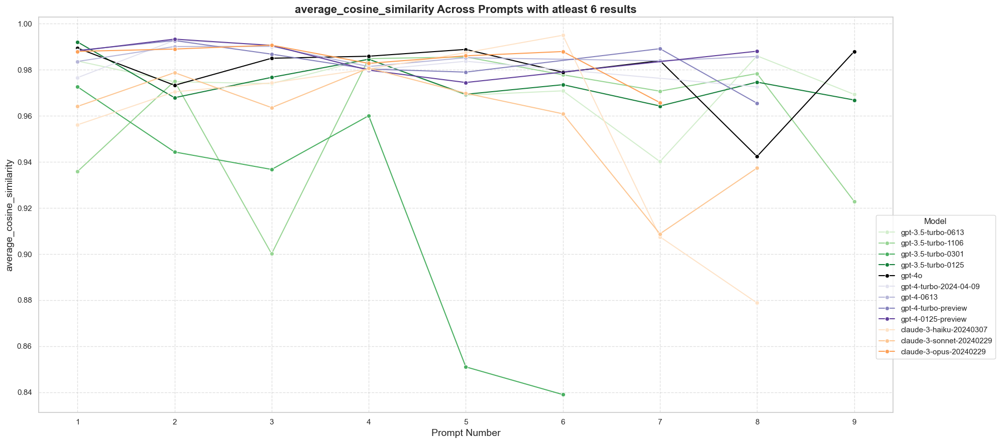

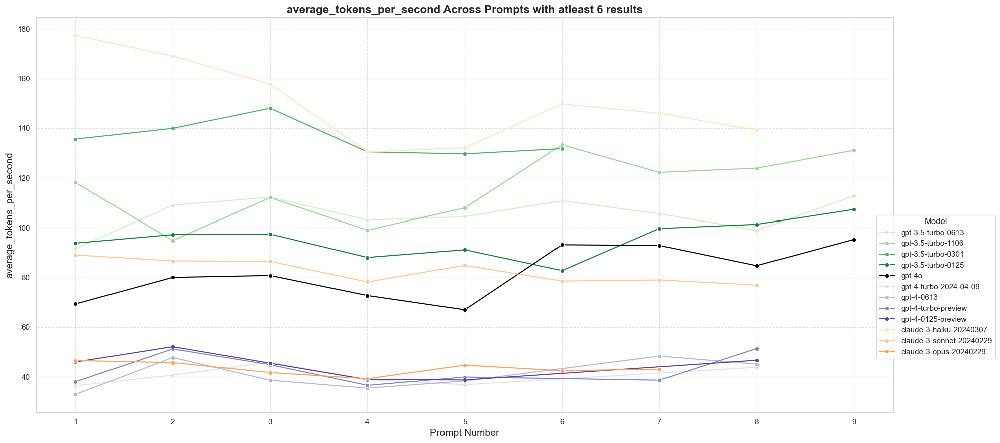

In [56]:
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set seaborn style for professional plots
sns.set(style="whitegrid")

# Function to prepare data for plotting
def prepare_data_for_plotting(all_evaluation_summaries, model_names):
    """Prepare data for plotting by restructuring it into a DataFrame."""
    data = []
    for prompt_index, summaries in enumerate(all_evaluation_summaries):
        for model_index, summary in enumerate(summaries):
            summary['Prompt'] = prompt_index + 1
            summary['Model'] = model_names[prompt_index][model_index]
            data.append(summary)
    return pd.DataFrame(data)

# Function to filter models with results for all 9 prompts
def filter_models_with_full_results(df):
    """Filter out models that do not have results for all 9 prompts."""
    model_counts = df['Model'].value_counts()
    valid_models = model_counts[model_counts >= 6].index
    return df[df['Model'].isin(valid_models)]

def plot_metric_trends(df, metric):
    """
    Plot trends for a given metric across different prompts for each model with a custom color palette based on model prefix.

    Args:
        df (pd.DataFrame): DataFrame containing the data to plot.
        metric (str): The metric to plot.
    """
    # Define base colors for each prefix using Seaborn color palettes
    base_colors = {
        'gpt-4-': sns.color_palette("Purples", 4),
        'gpt-3': sns.color_palette("Greens", 4),
        'gem': sns.color_palette("Blues", 5),
        'cla': sns.color_palette("Oranges", 6),
        'gpt-4o': ['black']  # Fixed color for 'gpt-4o'
    }

    # Generate a color for each model based on its prefix
    model_names = df['Model'].unique()
    colors = {}
    prefix_counts = {key: 0 for key in base_colors.keys()}
    
    for model in model_names:
        match = re.match(r"^(gpt-4-|gpt-3|gem|cla|gpt-4o)", model)
        if match:
            prefix = match.group(1)
            if prefix == 'gpt-4o':
                colors[model] = 'black'
            else:
                # Get a specific color from the list based on the index
                color_index = prefix_counts[prefix] % len(base_colors[prefix])
                colors[model] = base_colors[prefix][color_index]
                prefix_counts[prefix] += 1
        else:
            # Use a default gray color if no prefix match is found
            colors[model] = '#cccccc'

    # Apply the colors to the plot
    plt.figure(figsize=(20, 9))  # Increase the width of the plot
    sns.lineplot(data=df, x='Prompt', y=metric, hue='Model', palette=colors, marker='o')
    plt.title(f'{metric} Across Prompts with atleast 6 results', fontsize=16, weight='bold')
    plt.xlabel('Prompt Number', fontsize=14)
    plt.ylabel(metric, fontsize=14)
    plt.legend(title='Model', bbox_to_anchor=(1.05, 0.5), loc='upper center', borderaxespad=0.)  # Position legend to the right
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

def plot_combined_failed_tests(all_data):
    """Plot the combined line plot for all prompts."""
    plt.figure(figsize=(12, 8))
    colors = sns.color_palette("tab10", n_colors=9)  # Adjust this based on how many plots you have
    
    for i, data in enumerate(all_data):
        plt.plot(data[0], data[1], label=f'Prompt {i+1}', color=colors[i], marker='o')
    
    plt.xlabel('Test Case Number', fontsize=14)
    plt.ylabel('Number of Models Failed', fontsize=14)
    plt.title('Number of Models Failed per Test Case Across Prompts', fontsize=16, weight='bold')
    plt.xticks(data[0], fontsize=12)  # Assuming all test cases have the same number of cases
    plt.yticks(fontsize=12)
    plt.legend(title="Prompt Number")
    plt.grid(True, linestyle='--', linewidth=0.7)
    plt.tight_layout()
    plt.savefig("Combined_Failed_Tests.png", dpi=300)
    plt.show()

# Main Evaluation Loop and Data Aggregation (assuming you already have this set up)

# Example usage
# Combining all model names and summaries
all_model_names = [
    model_names_list_prompt1, model_names_list_prompt2, model_names_list_prompt3, 
    model_names_list_prompt4, model_names_list_prompt5, model_names_list_prompt6, 
    model_names_list_prompt7, model_names_list_prompt8, model_names_list_prompt9
]
all_evaluation_summaries = [
    evaluation_summaries_prompt1, evaluation_summaries_prompt2, evaluation_summaries_prompt3, 
    evaluation_summaries_prompt4, evaluation_summaries_prompt5, evaluation_summaries_prompt6, 
    evaluation_summaries_prompt7, evaluation_summaries_prompt8, evaluation_summaries_prompt9
]

# Prepare data for plotting
df = prepare_data_for_plotting(all_evaluation_summaries, all_model_names)

# Filter the models to only include those with results for all 9 prompts
df_filtered = filter_models_with_full_results(df)

# Plot trends for each metric
metrics = ['number_of_correct_answers', 'combined_failed', 'average_cosine_similarity', 'average_tokens_per_second']
for metric in metrics:
    if metric == 'combined_failed':
        plot_combined_failed_tests([
            (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt1]),
            (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt2]),
            (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt3]),
            (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt4]),
            (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt5]),
            (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt6]),
            (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt7]),
            (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt8]),
            (list(range(1, num_tests_all+1)), [len(failures) for failures in test_case_failures_prompt9])
        ])
        continue

    plot_metric_trends(df_filtered, metric)



### Proposal to Remedy the Problems Observed

Based on the experiments and evaluations, we observed several areas where language models,struggled with coreference resolution tasks. To address these issues, we propose the following strategies:

1. **Enhanced Prompt Engineering**:

   - **Contextual Prompts**: Develop prompts that provide richer context and background information. This can help models better understand the relationships between entities and resolve pronouns more accurately.
   - **Role-Playing Scenarios**: Continue using role-playing prompts where the model assumes the role of a professional in a relevant field. This approach has shown to significantly improve model performance by providing a specific and realistic context.
   - **Structured Instructions**: Design prompts with clear, step-by-step instructions, especially for complex tasks. Structured instructions can guide the model through the reasoning process, improving its ability to handle complex pronoun resolutions.

2. **Increased Use of Few-Shot Learning**:
   - **Provide Multiple Examples**: Incorporate multiple examples within the prompts to demonstrate the task. Few-shot learning has proven effective for models like GPT-3.5 and Claude Haiku, enabling them to learn from the examples and improve their performance.
   - **Diverse Examples**: Ensure that the examples cover a wide range of scenarios and complexities. This will help the models generalize better and handle various types of pronoun resolution tasks.

3. **Iterative Refinement and Feedback**:
   - **Retry Mechanism**: Implement a mechanism where the model can retry generating the output if the initial attempt is incorrect. Allowing multiple retries can help models refine their responses and achieve higher accuracy.
   - **Feedback Loop**: Create a feedback loop where incorrect outputs are analyzed, and the model is fine-tuned based on the errors. This iterative process can help the model learn from its mistakes and improve over time.

4. **Model-Specific Training**:
   - **Fine-Tuning on Specific Tasks**: Fine-tune models specifically for coreference resolution tasks using a dedicated dataset. This specialized training can enhance the model’s ability to handle pronoun resolution more effectively.
   - **Cross-Model Training**: Utilize training data generated from high-performing models (e.g., GPT-4) to train and improve lower-performing models (e.g., GPT-3.5). This transfer of knowledge can help elevate the performance of all models.

5. **Improved Normalization Techniques**:
   - **Standardize Output Formats**: Develop and apply advanced text normalization techniques to ensure consistent and fair comparisons. This includes standardizing output formats and removing extraneous information that might affect the evaluation.
   - **Context Preservation**: Ensure that normalization processes do not strip away critical contextual information. Maintaining context is essential for accurate pronoun resolution.

6. **Utilizing Assistant Models with Tool and Model Integration**:
   - **Tool-Using Models**: Leverage advanced assistant models capable of using external tools and resources to validate and enhance their outputs. These models can cross-check their responses using tools such as dictionaries, thesauruses, and knowledge bases.
   - **Model Interoperability**: Implement a system where larger models can delegate specific tasks to smaller, specialized models. For example, a primary model can use smaller models specifically trained for coreference resolution to validate and refine its outputs.
   - **Collaborative Validation**: Develop a framework where models can collaborate with each other, using outputs from one model to validate or improve the outputs of another. This multi-model approach can enhance accuracy and reliability.

### Conclusion

By implementing these strategies, we aim to address the observed problems and enhance the coreference resolution capabilities of language models. Enhanced prompt engineering, increased use of few-shot learning, iterative refinement, model-specific training, improved normalization techniques, a comprehensive evaluation framework, and the integration of assistant models capable of using tools and other models will collectively contribute to more accurate and reliable performance in complex NLP tasks. Continued research and development in these areas will be crucial for advancing the state-of-the-art in language models.


---



---
### Bonus Section 1: Attention heatmap of a head , attention of pronouns with nouns, 3d attention cube in a  transformer model(BERT)


- The task of the following  code is to analyze how the BERT language model distributes its attention between pronouns and nouns in sentences. This analysis helps to understand the model's ability to capture relationships between pronouns and their antecedents (the nouns they refer to).



[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\safwan\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\safwan\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


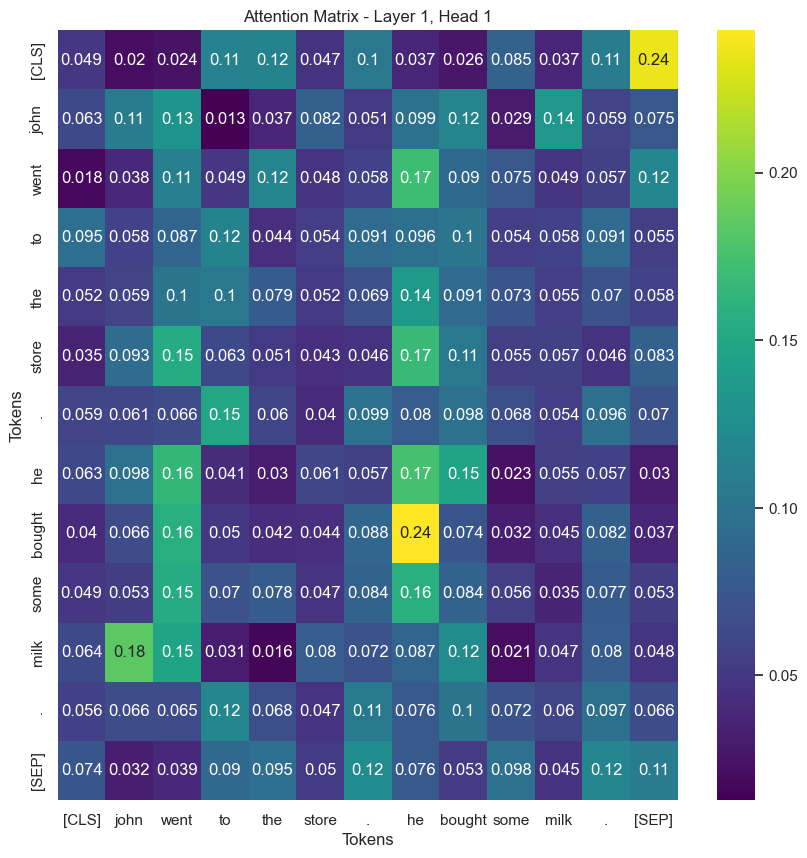

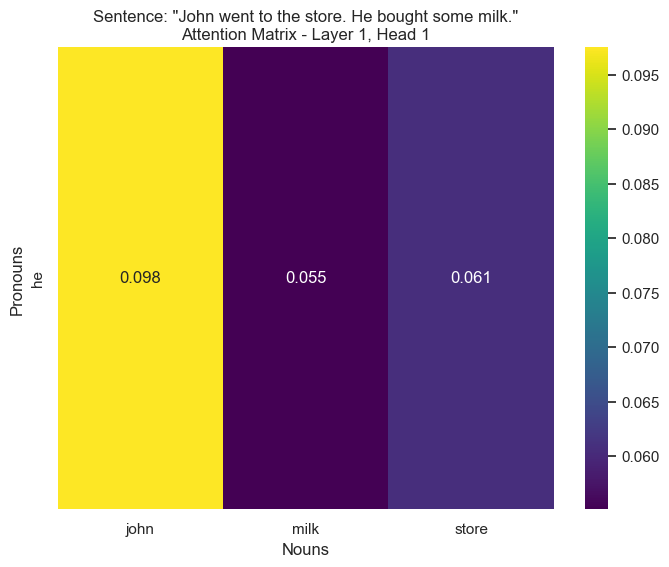

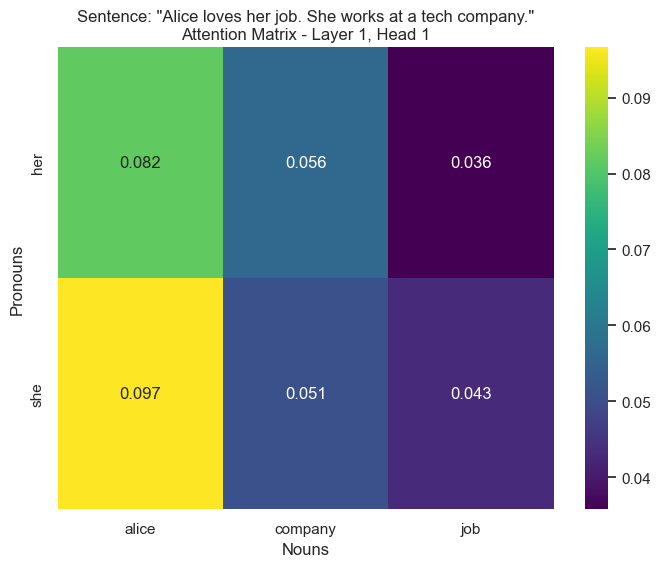

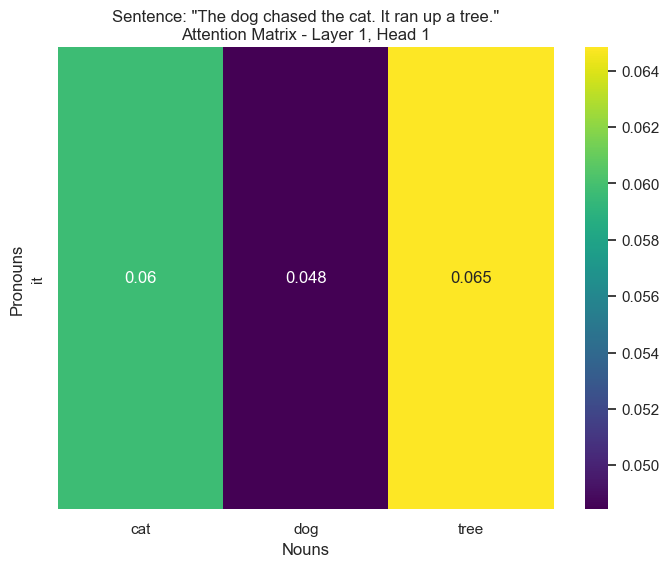

In [22]:
from transformers import BertTokenizer, BertModel
import nltk
from nltk import pos_tag
from nltk.tokenize import word_tokenize
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.io as pio
from plotly.offline import init_notebook_mode

# Download necessary NLTK data
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
init_notebook_mode(connected=True)

# List of sentences
texts = [
    "John went to the store. He bought some milk.",
    "Alice loves her job. She works at a tech company.",
    "The dog chased the cat. It ran up a tree."
]


def plot_attention_heatmap(attention_array, layer, head, sentence):
    # Filter attention scores for the specified layer and head
    filtered_array = [entry for entry in attention_array if entry['layer'] == layer and entry['head'] == head]

    # Create a matrix for the heatmap
    pronouns = sorted(list(set([entry['pronoun'] for entry in filtered_array])))
    nouns = sorted(list(set([entry['noun'] for entry in filtered_array])))

    if not pronouns or not nouns:
        print(f"No pronoun-noun pairs found for sentence: \"{sentence}\"")
        return

    matrix = [[0 for _ in nouns] for _ in pronouns]
    for entry in filtered_array:
        pronoun_idx = pronouns.index(entry['pronoun'])
        noun_idx = nouns.index(entry['noun'])
        matrix[pronoun_idx][noun_idx] = entry['attention_score']

    plt.figure(figsize=(8, 6))
    sns.heatmap(matrix, cmap='viridis', annot=True, xticklabels=nouns, yticklabels=pronouns)
    plt.xlabel('Nouns')
    plt.ylabel('Pronouns')
    plt.title(f'Sentence: "{sentence}"\nAttention Matrix - Layer {layer + 1}, Head {head + 1}')
    plt.show()
# Function to get attention array for pronouns with each noun
def get_pronoun_noun_attention(attentions, tokens):
    # Remove [CLS] and [SEP] tokens
    filtered_tokens = [token for token in tokens if token not in ['[CLS]', '[SEP]']]
    
    # POS tagging to identify nouns and pronouns
    pos_tags = pos_tag(filtered_tokens)
    nouns = [token for token, pos in pos_tags if pos in ('NN', 'NNS', 'NNP', 'NNPS')]
    pronouns = [token for token, pos in pos_tags if pos in ('PRP', 'PRP$')]

    # Find the BERT token indices for each noun and pronoun
    noun_indices = {noun: [i for i, token in enumerate(tokens) if token == noun] for noun in nouns}
    pronoun_indices = {pronoun: [i for i, token in enumerate(tokens) if token == pronoun] for pronoun in pronouns}

    attention_array = []
    num_layers = len(attentions)
    num_heads = attentions[0].shape[1]

    for layer in range(num_layers):
        for head in range(num_heads):
            attention_matrix = attentions[layer][0][head].detach().numpy()
            for pronoun, p_indices in pronoun_indices.items():
                for pronoun_idx in p_indices:
                    for noun, n_indices in noun_indices.items():
                        for noun_idx in n_indices:
                            attention_array.append({
                                'pronoun': pronoun,
                                'noun': noun,
                                'attention_score': attention_matrix[pronoun_idx, noun_idx],
                                'layer': layer,
                                'head': head
                            })
    return attention_array

# Function to create a 3D heatmap for a specific sentence
# Function to create a 3D heatmap for a specific sentence
def plot_attention_3d_heatmap(attention_array, sentence):
    pronouns = sorted(list(set([entry['pronoun'] for entry in attention_array])))
    nouns = sorted(list(set([entry['noun'] for entry in attention_array])))

    if not pronouns or not nouns:
        print(f"No pronoun-noun pairs found for sentence: \"{sentence}\"")
        return

    # Extract scores to determine the top 5%
    scores = [entry['attention_score'] for entry in attention_array]
    threshold = sorted(scores, reverse=True)[int(len(scores) * 0.05) - 1]

    # Filter entries based on the top 5% attention scores
    top_entries = [entry for entry in attention_array if entry['attention_score'] >= threshold]

    if not top_entries:
        print(f"No pronoun-noun pairs in the top 10% attention scores for sentence: \"{sentence}\"")
        return

    x = []
    y = []
    z = []
    labels = []
    top_scores = []

    for entry in top_entries:
        x.append(entry['layer'])
        y.append(entry['head'])
        pronoun_idx = pronouns.index(entry['pronoun'])
        noun_idx = nouns.index(entry['noun'])
        z.append((pronoun_idx, noun_idx))
        labels.append(f"{pronouns[pronoun_idx]}-{nouns[noun_idx]}")
        top_scores.append(entry['attention_score'])

    x_labels = [f"Layer {i + 1}" for i in range(len(set(x)))]
    y_labels = [f"Head {i + 1}" for i in range(len(set(y)))]
    pronoun_labels = pronouns
    noun_labels = nouns

    fig = go.Figure(data=[go.Scatter3d(
        x=x,
        y=y,
        z=[f"{pronoun_labels[p]}-{noun_labels[n]}" for p, n in z],
        mode='markers+text',
        text=labels,                # add text labels
        textposition='top center',  # position labels above the markers
        marker=dict(
            size=5,
            color=top_scores,       # set color to attention scores
            colorscale='Viridis',   # choose a colorscale
            colorbar=dict(title='Attention Score'),
            opacity=0.8
        )
    )])

    fig.update_layout(
        title=f'3D Attention Heatmap for Sentence: "{sentence}"',
        scene=dict(
            xaxis=dict(title='Layer', tickvals=list(range(len(x_labels))), ticktext=x_labels),
            yaxis=dict(title='Head', tickvals=list(range(len(y_labels))), ticktext=y_labels),
            zaxis=dict(title='Pronoun-Noun Pairs')
        )
    )

    # Use plotly.io.show to ensure the plot is embedded in the notebook and in the exported HTML
    pio.show(fig, renderer='notebook')


# Load pre-trained model tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Encode text
text1 = "John went to the store. He bought some milk."
inputs = tokenizer(text1, return_tensors='pt')

# Load pre-trained model
model = BertModel.from_pretrained('bert-base-uncased', output_attentions=True)

# Get the outputs of the model, including attention weights
outputs = model(**inputs)
attentions = outputs.attentions

# Decode the input_ids to get the tokens
tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])

# Function to get attention array for pronouns with each noun


# Get attention array
attention_array = get_pronoun_noun_attention(attentions, tokens)


# Visualize attention for the first layer and first head
first_layer_first_head_matrix = attentions[0][0][0].detach().numpy()
plt.figure(figsize=(10, 10))
sns.heatmap(first_layer_first_head_matrix, cmap='viridis', annot=True, xticklabels=tokens, yticklabels=tokens)
plt.xlabel('Tokens')
plt.ylabel('Tokens')
plt.title('Attention Matrix - Layer 1, Head 1')
plt.show()



# Process each sentence
for text in texts:
    # Tokenize the sentence
    tokens = word_tokenize(text)
    inputs = tokenizer(text, return_tensors='pt')
    outputs = model(**inputs)
    attentions = outputs.attentions
    bert_tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])
    attention_array = get_pronoun_noun_attention(attentions, bert_tokens)

    # Plot attention heatmap for the first layer and first head for each sentence
    plot_attention_heatmap(attention_array, layer=0, head=0, sentence=text)
# Process each sentence
for text in texts:
    # Tokenize the sentence
    tokens = word_tokenize(text)
    inputs = tokenizer(text, return_tensors='pt')
    outputs = model(**inputs)
    attentions = outputs.attentions
    bert_tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])
    attention_array = get_pronoun_noun_attention(attentions, bert_tokens)

    # Plot 3D attention heatmap for each sentence
    plot_attention_3d_heatmap(attention_array, sentence=text)
    
    # Function to create a heatmap for a specific sentence, layer, and head




### Bonus Section 2: Translating and Understanding LTR Hebrew Text

Have you ever wanted to copy Hebrew text from a PDF file, only to find that the copied text is left-to-right (LTR) instead of right-to-left (RTL)? This common issue can cause significant confusion and hinder readability. In this bonus section, we will explore the abilities of language models to handle and translate LTR Hebrew text into English, as well as to understand it correctly.

#### Task Description

The task involves evaluating the performance of various language models in translating and understanding Hebrew text that has been incorrectly formatted as LTR. This scenario is particularly challenging because the models must first recognize the improper text direction and then accurately translate or interpret the text.

#### Objectives

1. **Translation**:
   - Assess the models' ability to translate LTR Hebrew text into coherent English.
   - Evaluate how well the models can handle the reversal of text direction while maintaining the meaning and context.

2. **Understanding**:
   - Test the models' comprehension of LTR Hebrew text.
   - Determine the accuracy of responses based on the understanding of misformatted Hebrew text.

#### Methodology

1. **Data**:
   -  example of Hebrew text formatted as LTR from PDF file about nlp task for cs students to build a corpus in hebrew from  israeli kenneset docs .

2. **Model Evaluation**:
   - Use different language models to translate the LTR Hebrew text into English.
   - Analyze the translations for accuracy, context preservation, and readability.
   - Test the models' ability to comprehend and response to questions in the LTR Hebrew text.

3. **Metrics**:
   - **Translation Accuracy**: Measure the correctness of the translated text compared to the expected output.
   - **Context Preservation**: Evaluate how well the models maintain the original meaning and context in their translations.
   - **Comprehension Accuracy**: Assess the models' responses to questions about the LTR Hebrew text.

#### Expected Outcomes
most models wont be able to correctly read it , some models will read it , other models will read it and give a code solution 

In [55]:
import json
import re
import time
from openai import OpenAI
def query_openai_api(system_prompt, user_prompt, model="gpt-3.5-turbo-0125"):
    # Queries the OpenAI API with the given prompts and returns the response and elapsed time
    client = OpenAI()
    start_time = time.time()

    response = client.chat.completions.create(
        model=model,
        messages=[
            {"role": "system", "content": system_prompt},
            {"role": "user", "content": user_prompt}
        ],
        temperature=0.2,
        max_tokens=2000,
        top_p=1
    )
    
    end_time = time.time()
    elapsed_time = end_time - start_time
    
    return response.choices[0].message.content, elapsed_time

In [16]:
ltr_hebrew = """
מ 
 
  ליגרתב הז הנבנ    ,רמולכ ,סופרוק רוצינ    בחרנ ילאוטסקט רגאמ סרוקה ךלהמב דובענ ותיא  דובענ ותיא טסקטה .
  טסקט אוה תירבעב  , חוקלה  ו תואילמ לש םילוקוטורפמ -תסנכה תודעו טסקטה .    ,תסנכ ירבח ידי לע ובורב בתכנ
 .תסנכה תודעווב םיחרואו םירש  דובענ םתיא םיטסקטה  לע )טעמ הכרענו( הבתכנש הרובד הפשמ ןה םיבכרומ
  .שארמ םיבותכ םימואנמ ןהו תוי/םינדלק ידי 
 
 בלש 1 – טסקטב לופיט 
 
  ץבוק ףרוצמ ליגרתל zip  ליכמה   הבש הייקית  כ 100    יכמסמ  word    טמרופב docx  לוקוטורפ הווהמ ךמסמ לכ .
 .דחא ולא םיכמסממ רוציל םכילע סופרוק אבה ןפואב  ( ובתכתש ח״ודב םכיתוריחב לע טוריפ ךות ) : 
1 .   ךותמ םינותנ תפילש  תומש :םילוקוטורפה יצבק    אבה טמרופב אוה ךמסמ לש םש לכ
 _fileNumber.docx v _pt XX    וא    _fileNumber.docx m _pt XX  .    :רשאכ 
a . XX  –  ךייש לוקוטורפה וילא תסנכה רפסמ אוה  ב התיה הנושארה תסנכה(-1948  תסנכה ;
 ה איה תיחכונה-25 ) . 
b . m pt – האילמ לש לוקוטורפ והזש למסמ . 
c . v pt – הדעו לש לוקוטורפ והזש למסמ . 
 :ץבוק םש לכל רומשלו ףולשל םכילע 
א .  כ ךייש אוה וילא תסנכה רפסמ תא-Integer . 
ב .  היצקידניא :הדעו לש וא האילמ לש לוקוטורפ הז םא 
a . ה תויהל ךירצ הדשה ךרע הדעוו רובע-string : “committee” 
b . ה תויהל ךירצ הדשה ךרע האילמ רובע-string : “plenary” 
 
2 .   תפילש לוקוטורפ רפסמ :  ב  תליחת  לוקוטורפ לכ  ןיוצמ  רפסמ כ"דב לוקוטורפה  הבישיה רפסמ וא  ופלש  .
 טסקטה ךותמ הז רפסמ ךירצ םא ותוא ודבע ,  כ ורמשו-Integer .    םא  וא הזכ רפסמ םייק אל  אל
 א ץלחל םתחלצה ותו כ ורמש- 1-   . 
 
3 .   תפילש טסקט  :ןכות לעב    תמישר ,םויה רדס טוריפ ,תורתוכ ,םינומיסב בורל ליחתמ לוקוטורפ לכ
  הז אוה יטנוולרה טסקטה ונתניחבמ .'וכו םינמזומ  ידי לע רמאנש  לע ובשיח .האילמ/הדעווב םירבוד
  םיטסקטה ןיב ןיחבהל ךרד ייטנוולרה ם  ראשל  טסקטה   ,םירבודה תומש תא לוקוטורפ לכ ךותמ ופלישו
 לוקוטורפב ועיפוהש יפכ ,  ו  תא  טסקטה  ידי לע רמאנש .ת/רבוד לכ    םכלש תוטלחהה לע ח"ודב ובתיכ
  .םתרחבש שומימה ךרדו 
  רטסמס ב ׳ 4 202   תויעבט תופש דוביע– הפיח תטיסרבינוא 
 
 2 
a .   לככ ושע .'וכו הגלפמה םש ,דיקפת ומכ תופסות םע עיפוהל םילוכי םירבודה תומשש בל ומיש
 הלו תופסותה תא תוקנל םכתלוכי י עציב ךיא ח"ודב וטרפ .ת/רבודה םש םע קר ראש ת תא ם
  .ל"נה ןויקנה 
b .   תומשב שומישב תויהל תולוכי תויעב וליא ובשיח םילוקוטורפב ועיפוהש יפכ  ינפל ו ירחא    ןויקנ
  .ח"ודב ךכ לע ונע .תומשה 
ידכ  הז בלש תא עצבל ב שמתשהל םילוכי םתא ,  הקלחמ Document  ה ךותמ הירפס    docx    רובעל תנמ לע
  .ךמסמה ךותמ טסקטה תא אורקלו תואקספ לע 
  המגוד הטושפ  :הירפסב שומישל
from docx import Document 
 
document = Document(file_path) 
 
for par in document.paragraphs: 
    par_text = par.text
ה 
  םיטסקט .לוקוטורפה עצמאב םיעיפומש םירחא םיטסקט וא תורתוכ םע דדומתהל וכרטצתו ןכתיי
  םניא ולא  םיכיושמ ולא םיטסקט םע םידדומתמ םתא ךיא רוחבל ולכות .רבוד ףאל : לשמל ,    םתוא ףרצל
  םכתריחב תא ח"ודב ובתכ .ןיטולחל םהמ םלעתהל וא ר"ויה לש טסקטכ ,ןורחאה רבודה לש טסקטכ
  .וריבסהו 
 
4 . :םיטפשמל הקולח  ,ול ךיישה טסקטה לכ תא רבוד לכל םתפלשש רחאל  כילע ם    תוהזל דציכ עובקל
 ךותב םיטפשמ ןיב תולובג טסקטה כתעיבק לע טרפלו , ם    .ח״ודב 
• ןיא ינוציח תוירפסב שמתשהל ו םיטפשמה תקולחל ת 
 
5 . :םיטפשמה ןויקנ  לשמל .םיינקת אל תויהל םילוכי סופרוקב םיטפשמהמ קלח ,    םיטפשמ  םיליכמה
 תילגנא  , תויתוא םניאש םיוות קר םיליכמש םיטפשמ  ,  בורלו )םימלש אל( עצמאב וכתחנש םיטפשמ
  תמגוד םיוות י"ע םינמוסמ “- - -“  דועו  תוהזל וסנ . ןנסלו    םיטפשמ  םיניקת אל ולאכ   ,םירחא םגו  
הלו י תירבעב םיניקת םיטפשמ םע קר ראש םיצוליאב תובשחתה ךות ,  םע םתדדומתה ךיא וחווד .
  .ח"ודב וז המישמ 
 
6 . :היצזינקוט  כילע ם  טסקטה לע תאז שממלו םינקוטל םיטפשמ קלחל דציכ עובקל    ינמיס םע תודדומתה(
 תובית ישאר ,קוסיפ  כתעיבק לע טרפל שי .)דועו ם .ח״ודב  
•   .םידרפנ םינקוט ויהי קוסיפ ינמיס ,םיגירח םירקמ טעמל  שיש םיגירחה םירקמה לע ובשח
 .ח״ודב ךכ לע וטרפו הנוש םהילא סחייתהל 
•   ,רמולכ ,םילימל יגולופרומ חותינ עצבל ךרוצ ןיא תומפרומ דירפהל ךרוצ ןיא ,  לשמל    ומכ( יוביר
 ״ רפס םי )״ , "( רוביח תויתוא ו "( העידיה 'ה ,)"רפס ה  .'וכו )"רפס 
•  .דחא חוורב דרפומ ןקוט לכ 

 
 3 
• ןיא ינוציח תוירפסב שמתשהל ו היצזינקוטל ת 
7 . :דובעל ןתינ םתיא םיטפשמ תפילש    שמתשהל הצרנ ןתוא רוקחל ידכו ,תויעבט תופשב קוסענ סרוקב
 ןכל .תודדוב םילימ אלו ,םילימ יפוריצמ םיבכרומה םיסופרוקב  , נ  סופרוקב לולכ  קר  םהבש םיטפשמ
 תוחפל 4 םינקוט .    
 
8 .  ץבוקכ םינותנה תרימש jsonl : 
 ץבוק JSONL ( JSON lines איה הרוש לכ ובש ץבוק אוה ) JSON  .ינקת 
ץבוק תויהל ךירצ הנכותה לש טלפה  JSONL    איה הרוש לכ ובש JSON   לש    תודשה םע דחא טפשמ
 םיאבה  : 
a . protocol_name טורפה לש ץבוקה םש : ו  ףיעס ואר( לוק 1.1 ) . 
b . knesset_number טורפה הנממ תסנכה רפסמ : ו ףיעס ואר( חוקל לוק 1.1 ) . 
c . protocol_type טורפה םאה : ו ףיעס ואר( האילמ וא הדעו אוה לוק 1.1 ) . 
d . protocol_number ףיעס ואר( לוקוטורפה רפסמ : 1.2 ) 
e . speaker_name ףיעס ואר( רבודה םש : 1.3 ) . 
f . sentence_text םיפיעס ואר( היציזנקוט רחאל רבוד ותואל ךיישה טפשמ : 1.3-1.7 ) . 
•  ץבוק ה JSONL   .וידחי םילוקוטורפה לכמ ,סופרוקב םתללכש םיטפשמה לכ תא ליכי 
• ירפסב ךכ םשל שמתשהל ןתינ תו  json , pandas . 
•  דודיקב טלפה תא בותכל שי utf-8 .
"""


---
## Bonus 2 appendix-gpt

In [ ]:
prompt0= f"""{ltr_hebrew}"""

prompt1= f"""Translate the following Hebrew text to English: {ltr_hebrew}"""
prompt2= f"""Translate to English: {ltr_hebrew}"""
prompt3= f"""Translate to English you can use tools like python: {ltr_hebrew}"""
prompt4= f"""help me with the following: {ltr_hebrew}"""
prompts=[prompt0,prompt1,prompt2,prompt3,prompt4]
models=[  "gpt-3.5-turbo-16k","gpt-4o","gpt-4-turbo-2024-04-09","gpt-4-turbo-preview","gpt-4-0125-preview",]

for model in models:
    print(f"Model: {model}")
    i=0
    for prompt in prompts:
        response, elapsed_time = query_openai_api('', prompt, model=model)
        print(f"Prompt {i+1}")
        i+=1
        print(f"Response: {response}")
        print(f"Elapsed Time: {elapsed_time:.2f} seconds")
        print(80*"=")
        print("\n")
        

---
## Bonus 2 appendix-gpt

In [ ]:
import os
import json
import time
import tiktoken
from sklearn.metrics.pairwise import cosine_similarity
import google.generativeai as genai
import textwrap
from IPython.display import display, Markdown
prompt0= f"""{ltr_hebrew}"""

prompt1= f"""Translate the following Hebrew text to English: {ltr_hebrew}"""
prompt2= f"""Translate to English: {ltr_hebrew}"""
prompt3= f"""Translate to English you can use tools like python: {ltr_hebrew}"""
prompt4= f"""help me with the following: {ltr_hebrew}"""
prompts=[prompt0,prompt1,prompt2,prompt3,prompt4]
def to_markdown(text):
    text = text.replace('•', '  *')
    return Markdown(textwrap.indent(text, '> ', predicate=lambda _: True))


def query_gemini_api(system_prompt, user_prompt,model_name):
    genai.configure(api_key='api-key')
    model = genai.GenerativeModel(model_name)

    
    # Gemini does not support system prompts directly, so we include the system prompt in the user prompt
    combined_prompt = f"{system_prompt}\n\n{user_prompt}"
    
    start_time = time.time()  # Start time before the API call

    response = model.generate_content(combined_prompt)
    
    end_time = time.time()  # End time after the API call
    elapsed_time = end_time - start_time  # Calculate elapsed time
    print(elapsed_time)
    return response.text, elapsed_time


models_names=['gemini-1.0-pro-latest', 'gemini-1.0-pro-001','gemini-1.0-pro','gemini-1.5-flash-latest','gemini-1.5-pro-latest']

for model in models_names:
    print(f"Model: {model}")
    i=0
    for prompt in prompts:
        print(f"Prompt {i+1}")
        i+=1
        response, elapsed_time = query_gemini_api('', prompt,model_name=model)
        if model == 'gemini-1.5-pro-latest':
            time.sleep(20)
        if model == 'gemini-1.5-flash-latest':
            time.sleep(2)
        print(f"Response: {response}")
        print(f"Elapsed Time: {elapsed_time:.2f} seconds")
        print("\n")
